In [ ]:
### 재시작 셀 ###
# === 매 세션 시작 시 이 셀 1번만 실행 (재시작용) ===

from google.colab import drive
drive.mount('/content/drive')

!pip install ultralytics -q

import os

# 3주차 정식 작업 폴더(1-2주차는 driving 폴더)
BASE = "/content/drive/MyDrive/driving2"

# 영상별 폴더는 처리할 때마다 동적으로 생성(driving2/v01, v02,...,v10)

# 공용 영상 폴더(원본 영상 10개 저장)
os.makedirs(f"{BASE}/data/videos", exist_ok=True)
os.chdir(BASE)

# ByteTrack 설정 (1~2주차와 동일)
bytetrack_config = """tracker_type: bytetrack
track_high_thresh: 0.4
track_low_thresh: 0.1
new_track_thresh: 0.5
track_buffer: 90
match_thresh: 0.8
fuse_score: True
"""
with open('/content/custom_bytetrack.yaml', 'w') as f:
    f.write(bytetrack_config)

import torch
print("GPU:", torch.cuda.is_available())
print("BASE:", BASE)
print("준비 완료 (3주차 정식 작업)")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
GPU: True
BASE: /content/drive/MyDrive/driving2
준비 완료 (3주차 정식 작업)


In [ ]:
### 작업할 영상 선택 + 영상별 폴더 생성 ###

import cv2
import os

# === ⬇️ 처리할 영상 번호와 파일명 (영상마다 이 부분만 바꿔서 재실행) ===
VIDEO_ID = "v06"                          # 영상 ID
VIDEO_FILE = "v06.mp4"                    # 영상 파일명
# ===================================================================

# 영상별 작업 폴더 (구조 자동 생성)
VIDEO_BASE = f"{BASE}/{VIDEO_ID}"
os.makedirs(f"{VIDEO_BASE}/configs/calibration", exist_ok=True)
os.makedirs(f"{VIDEO_BASE}/outputs", exist_ok=True)
os.makedirs(f"{VIDEO_BASE}/outputs/videos", exist_ok=True)
os.makedirs(f"{VIDEO_BASE}/outputs/reports", exist_ok=True)

video_path = f"{BASE}/data/videos/{VIDEO_FILE}"

# 영상 정보 확인
cap = cv2.VideoCapture(video_path)
if not cap.isOpened():
    print(f"❌ 영상 파일을 찾을 수 없음: {video_path}")
    print(f"   {BASE}/data/videos/ 에 {VIDEO_FILE} 파일이 있는지 확인")
else:
    fps_video = cap.get(cv2.CAP_PROP_FPS)
    total_frames_video = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    cap.release()

    print(f"=== 영상 정보 ({VIDEO_ID}) ===")
    print(f"  파일: {VIDEO_FILE}")
    print(f"  해상도: {width} x {height}")
    print(f"  FPS: {fps_video:.2f}")
    print(f"  총 프레임: {total_frames_video}")
    print(f"  길이: {total_frames_video/fps_video:.2f}초")
    print(f"\n작업 폴더: {VIDEO_BASE}")

=== 영상 정보 (v06) ===
  파일: v06.mp4
  해상도: 1280 x 720
  FPS: 24.00
  총 프레임: 652
  길이: 27.17초

작업 폴더: /content/drive/MyDrive/driving2/v06


/tmp/ipykernel_52932/1012811162.py:29: UserWarning: Glyph 52488 (\N{HANGUL SYLLABLE CO}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 52488 (\N{HANGUL SYLLABLE CO}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


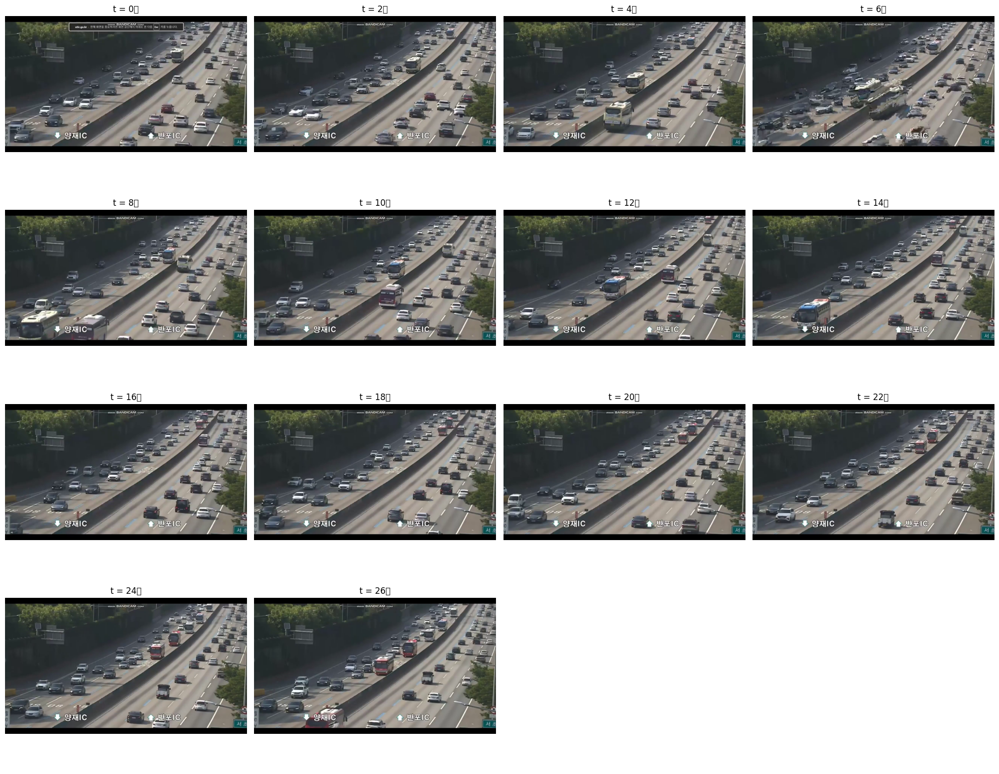

영상 길이: 27.2초, 총 652프레임


In [ ]:
### 영상 미리보기 (시점별 프레임 확인) ###
import cv2
import matplotlib.pyplot as plt

cap = cv2.VideoCapture(video_path)
total = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
fps_local = cap.get(cv2.CAP_PROP_FPS)
duration = total / fps_local

# 2초 간격으로 프레임 추출
sample_times = list(range(0, int(duration) + 1, 2))
n_cols = 4
n_rows = (len(sample_times) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 4*n_rows))
axes = axes.flatten()

for i, t in enumerate(sample_times):
    cap.set(cv2.CAP_PROP_POS_FRAMES, int(t * fps_local))
    ret, frame = cap.read()
    if ret:
        axes[i].imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        axes[i].set_title(f't = {t}초')
        axes[i].axis('off')

for j in range(len(sample_times), len(axes)):
    axes[j].axis('off')

cap.release()
plt.tight_layout()
plt.show()

print(f"영상 길이: {duration:.1f}초, 총 {total}프레임")

In [ ]:
### 차량 제거 도로 배경 + 기준 프레임(깨끗한 구간으로 read_only + calib_frame 만들기) ###

import cv2
import numpy as np

# ⬇️ 영상 보고 정해서 입력
START_TIME = 22.0    # 깨끗 구간 시작 (초)
END_TIME = 26.0      # 깨끗 구간 끝 (초)
# ===================================

cap = cv2.VideoCapture(video_path)
fps_local = cap.get(cv2.CAP_PROP_FPS)
total_local = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

start_frame = int(START_TIME * fps_local)
end_frame = min(int(END_TIME * fps_local), total_local)

# 구간 내 프레임 수집 (2프레임씩 샘플링)
frames = []
for frame_idx in range(start_frame, end_frame, 2):
    cap.set(cv2.CAP_PROP_POS_FRAMES, frame_idx)
    ret, frame = cap.read()
    if ret:
        frames.append(frame.astype(np.float32))

# 중앙값으로 차량 제거 → road_only
road_only = np.median(np.stack(frames), axis=0).astype(np.uint8)

# 첫 프레임 (calib_frame용)
cap.set(cv2.CAP_PROP_POS_FRAMES, 0)
ret, first_frame = cap.read()
cap.release()

cv2.imwrite(f"{VIDEO_BASE}/configs/calibration/calib_frame.jpg", first_frame)
cv2.imwrite(f"{VIDEO_BASE}/configs/calibration/road_only.jpg", road_only)

print(f"✅ 저장 완료")
print(f"  - 수집 프레임: {len(frames)}개 ({START_TIME}~{END_TIME}초)")
print(f"  - {VIDEO_BASE}/configs/calibration/calib_frame.jpg")
print(f"  - {VIDEO_BASE}/configs/calibration/road_only.jpg")

✅ 저장 완료
  - 수집 프레임: 48개 (22.0~26.0초)
  - /content/drive/MyDrive/driving2/v06/configs/calibration/calib_frame.jpg
  - /content/drive/MyDrive/driving2/v06/configs/calibration/road_only.jpg


In [ ]:
### 차량 제거 도로 배경 + 기준 프레임 ###

import numpy as np

cap = cv2.VideoCapture(video_path)
total = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

# 영상 전체에서 10프레임 샘플링
frames = []
for ratio in [0.05, 0.15, 0.25, 0.35, 0.45, 0.55, 0.65, 0.75, 0.85, 0.95]:
    idx = int(total * ratio)
    cap.set(cv2.CAP_PROP_POS_FRAMES, idx)
    ret, frame = cap.read()
    if ret:
        frames.append(frame.astype(np.float32))
cap.release()

# 중앙값으로 차량 제거
road_only = np.median(np.stack(frames), axis=0).astype(np.uint8)

# 첫 프레임 (캘리브레이션용)
cap = cv2.VideoCapture(video_path)
ret, first_frame = cap.read()
cap.release()

cv2.imwrite(f"{VIDEO_BASE}/configs/calibration/calib_frame.jpg", first_frame)
cv2.imwrite(f"{VIDEO_BASE}/configs/calibration/road_only.jpg", road_only)

print(f"✅ 저장 완료")
print(f"  - {VIDEO_BASE}/configs/calibration/calib_frame.jpg")
print(f"  - {VIDEO_BASE}/configs/calibration/road_only.jpg")

✅ 저장 완료
  - /content/drive/MyDrive/driving2/v06/configs/calibration/calib_frame.jpg
  - /content/drive/MyDrive/driving2/v06/configs/calibration/road_only.jpg


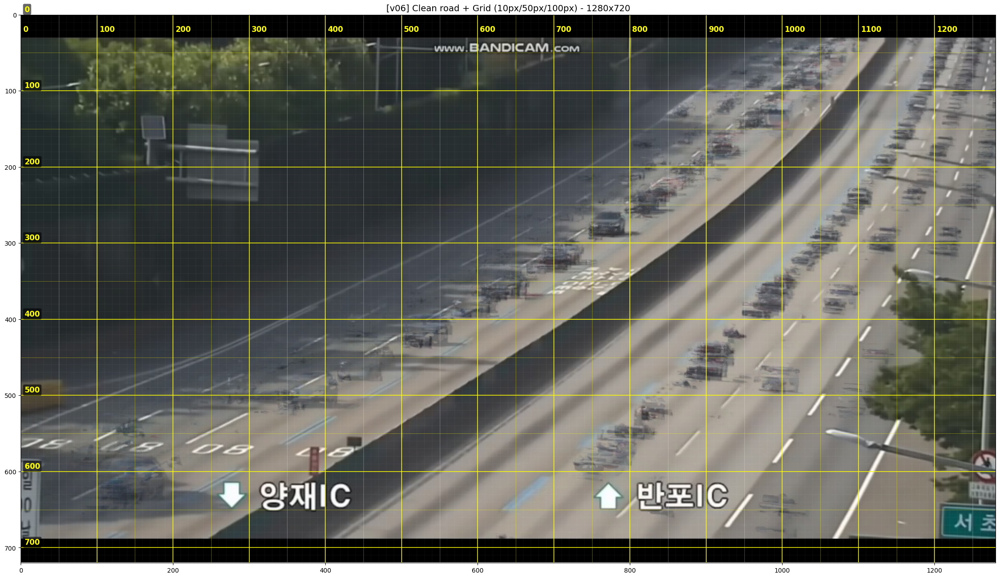


저장: /content/drive/MyDrive/driving2/v06/configs/calibration/calib_grid_10px.jpg
이미지: 1280 x 720


In [ ]:
### 10픽셀 격자 (4점 잡기용) ###

import matplotlib.pyplot as plt

road_only = cv2.imread(f"{VIDEO_BASE}/configs/calibration/road_only.jpg")
h, w = road_only.shape[:2]

fig, ax = plt.subplots(figsize=(28, 16))
ax.imshow(cv2.cvtColor(road_only, cv2.COLOR_BGR2RGB))

# 10픽셀 (얇은 흰)
for x in range(0, w, 10):
    if x % 50 != 0:
        ax.axvline(x=x, color='white', alpha=0.12, linewidth=0.3)
for y in range(0, h, 10):
    if y % 50 != 0:
        ax.axhline(y=y, color='white', alpha=0.12, linewidth=0.3)

# 50픽셀 (연한 노랑)
for x in range(0, w, 50):
    if x % 100 != 0:
        ax.axvline(x=x, color='yellow', alpha=0.4, linewidth=0.6)
for y in range(0, h, 50):
    if y % 100 != 0:
        ax.axhline(y=y, color='yellow', alpha=0.4, linewidth=0.6)

# 100픽셀 (굵은 노랑 + 좌표)
for x in range(0, w, 100):
    ax.axvline(x=x, color='yellow', alpha=0.9, linewidth=1.2)
    ax.text(x+3, 22, str(x), color='yellow', fontsize=12, weight='bold',
            bbox=dict(boxstyle='round,pad=0.2', facecolor='black', alpha=0.6, edgecolor='none'))
for y in range(0, h, 100):
    ax.axhline(y=y, color='yellow', alpha=0.9, linewidth=1.2)
    ax.text(5, y-4, str(y), color='yellow', fontsize=12, weight='bold',
            bbox=dict(boxstyle='round,pad=0.2', facecolor='black', alpha=0.6, edgecolor='none'))

ax.set_title(f'[{VIDEO_ID}] Clean road + Grid (10px/50px/100px) - {w}x{h}', fontsize=14)
ax.set_xlim(0, w)
ax.set_ylim(h, 0)

grid_path = f"{VIDEO_BASE}/configs/calibration/calib_grid_10px.jpg"
plt.savefig(grid_path, dpi=130, bbox_inches='tight')
plt.show()

print(f"\n저장: {grid_path}")
print(f"이미지: {w} x {h}")

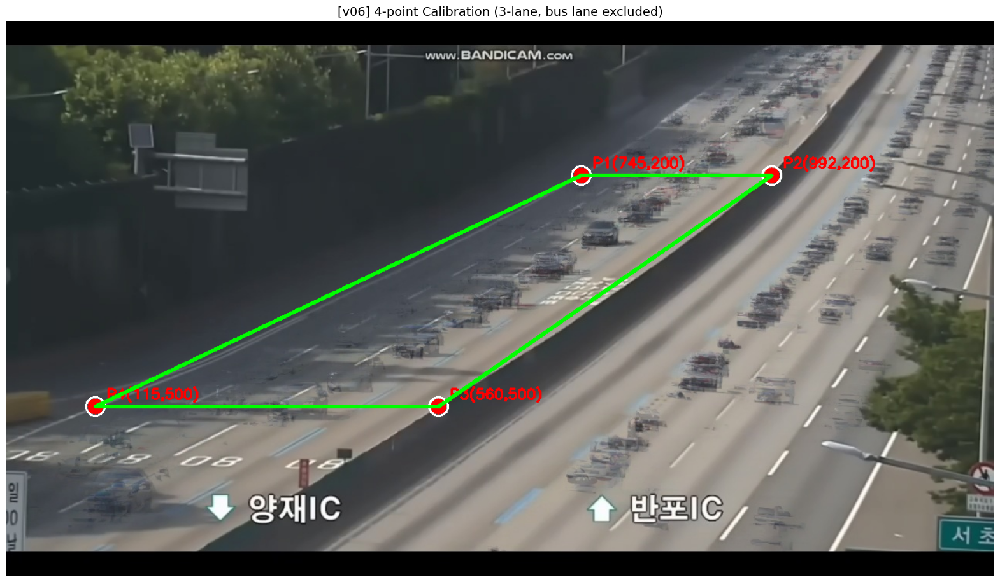

4점 좌표:
  P1: (745, 200)
  P2: (992, 200)
  P3: (560, 500)
  P4: (115, 500)


In [ ]:
### 4점 시각화 ###

import cv2
import numpy as np
import matplotlib.pyplot as plt

# 내가 정한 4점 (3차로, 4차선 제외) - 새 좌표
src_pts = np.array([
    [745, 200],   # P1 좌상 - 멀리 왼쪽
    [992, 200],   # P2 우상 - 멀리 오른쪽 (4차선 직전)
    [560, 500],   # P3 우하 - 가까이 오른쪽 (4차선 직전)
    [115, 500],   # P4 좌하 - 가까이 왼쪽
], dtype=np.float32)

road_only = cv2.imread(f"{VIDEO_BASE}/configs/calibration/road_only.jpg")
vis = road_only.copy()

for i, (x, y) in enumerate(src_pts):
    cv2.circle(vis, (int(x), int(y)), 10, (0, 0, 255), -1)
    cv2.circle(vis, (int(x), int(y)), 12, (255, 255, 255), 2)
    cv2.putText(vis, f"P{i+1}({int(x)},{int(y)})",
                (int(x)+15, int(y)-10),
                cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)

for i in range(4):
    pt1 = tuple(src_pts[i].astype(int))
    pt2 = tuple(src_pts[(i+1) % 4].astype(int))
    cv2.line(vis, pt1, pt2, (0, 255, 0), 3)

plt.figure(figsize=(20, 12))
plt.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
plt.title(f'[{VIDEO_ID}] 4-point Calibration (3-lane, bus lane excluded)', fontsize=14)
plt.axis('off')
plt.savefig(f"{VIDEO_BASE}/configs/calibration/calib_points.jpg", dpi=120, bbox_inches='tight')
plt.show()

print(f"4점 좌표:")
for i, (x, y) in enumerate(src_pts):
    print(f"  P{i+1}: ({x:.0f}, {y:.0f})")

=== 호모그래피 행렬 H ===
[[ 1.21739130e-01  2.55652174e-01 -1.41826087e+02]
 [-3.63358876e-17 -2.14782609e-01  1.07391304e+02]
 [ 2.96473449e-18  5.73913043e-03  1.00000000e+00]]

=== 4점 변환 검증 ===
  P1: 픽셀(745,200) → 미터(-0.00,30.00) | 기대(0.0,30.0)
  P2: 픽셀(992,200) → 미터(14.00,30.00) | 기대(14.0,30.0)
  P3: 픽셀(560,500) → 미터(14.00,0.00) | 기대(14.0,0.0)
  P4: 픽셀(115,500) → 미터(0.00,0.00) | 기대(0.0,0.0)


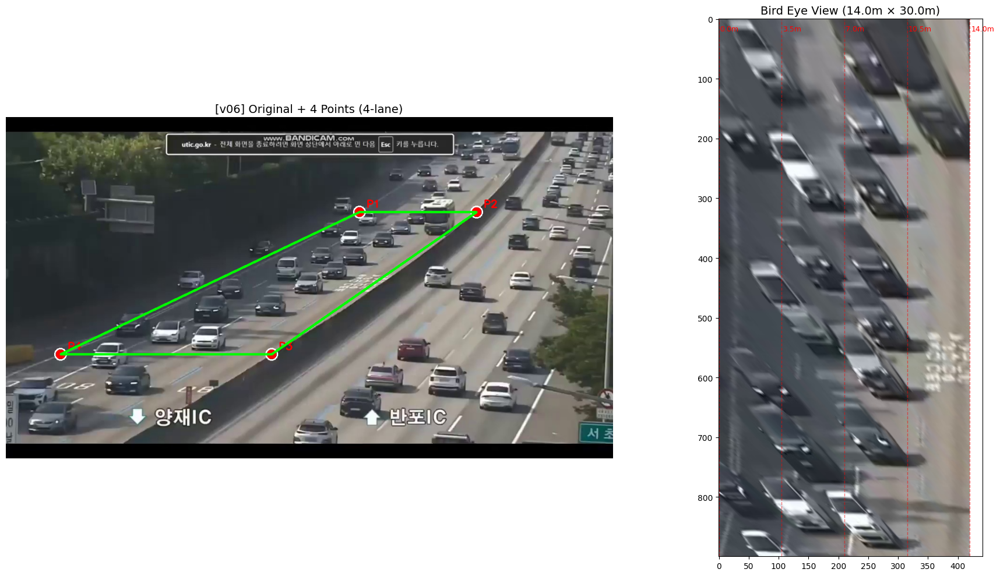


✅ 호모그래피 저장


In [ ]:
### 호모그래피 + BEV 검증 ###

import cv2
import numpy as np
import matplotlib.pyplot as plt
import json

# 4차로 도로
LANE_WIDTH_M = 3.5
NUM_LANES = 4
ROAD_WIDTH_M = LANE_WIDTH_M * NUM_LANES   # 14m
SEGMENT_LENGTH_M = 30.0                    # y=200~500 추정 30m

dst_pts = np.array([
    [0.0,             SEGMENT_LENGTH_M],
    [ROAD_WIDTH_M,    SEGMENT_LENGTH_M],
    [ROAD_WIDTH_M,    0.0],
    [0.0,             0.0],
], dtype=np.float32)

H, _ = cv2.findHomography(src_pts, dst_pts)
print(f"=== 호모그래피 행렬 H ===")
print(H)

def pixel_to_road(px, py, H):
    pt = np.array([[[px, py]]], dtype=np.float32)
    road = cv2.perspectiveTransform(pt, H)
    return float(road[0, 0, 0]), float(road[0, 0, 1])

print(f"\n=== 4점 변환 검증 ===")
for i, (src, expected) in enumerate(zip(src_pts, dst_pts)):
    rx, ry = pixel_to_road(src[0], src[1], H)
    print(f"  P{i+1}: 픽셀({src[0]:.0f},{src[1]:.0f}) → 미터({rx:.2f},{ry:.2f}) | 기대({expected[0]:.1f},{expected[1]:.1f})")

# BEV
SCALE = 30
bev_w = int(ROAD_WIDTH_M * SCALE)
bev_h = int(SEGMENT_LENGTH_M * SCALE)

dst_pts_bev = np.array([
    [0,      bev_h],
    [bev_w,  bev_h],
    [bev_w,  0],
    [0,      0],
], dtype=np.float32)

H_bev, _ = cv2.findHomography(src_pts, dst_pts_bev)
frame = cv2.imread(f"{VIDEO_BASE}/configs/calibration/calib_frame.jpg")
bev = cv2.warpPerspective(frame, H_bev, (bev_w, bev_h))
bev_flipped = cv2.flip(bev, 0)

# 시각화
vis = frame.copy()
for i, (x, y) in enumerate(src_pts):
    cv2.circle(vis, (int(x), int(y)), 10, (0, 0, 255), -1)
    cv2.circle(vis, (int(x), int(y)), 12, (255, 255, 255), 2)
    cv2.putText(vis, f"P{i+1}", (int(x)+15, int(y)-10),
                cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 255), 2)
for i in range(4):
    pt1 = tuple(src_pts[i].astype(int))
    pt2 = tuple(src_pts[(i+1) % 4].astype(int))
    cv2.line(vis, pt1, pt2, (0, 255, 0), 3)

fig, axes = plt.subplots(1, 2, figsize=(20, 10))
axes[0].imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
axes[0].set_title(f'[{VIDEO_ID}] Original + 4 Points ({NUM_LANES}-lane)', fontsize=14)
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(bev_flipped, cv2.COLOR_BGR2RGB))
axes[1].set_title(f'Bird Eye View ({ROAD_WIDTH_M}m × {SEGMENT_LENGTH_M}m)', fontsize=14)
for i in range(NUM_LANES + 1):
    x_line = i * LANE_WIDTH_M * SCALE
    axes[1].axvline(x=x_line, color='red', alpha=0.5, linestyle='--', linewidth=1)
    axes[1].text(x_line+2, 20, f'{i*LANE_WIDTH_M:.1f}m', color='red', fontsize=9)

plt.tight_layout()
plt.savefig(f"{VIDEO_BASE}/configs/calibration/bev_check.jpg", dpi=120, bbox_inches='tight')
plt.show()

np.save(f"{VIDEO_BASE}/configs/calibration/H_matrix.npy", H)

meta = {
    "video_id": VIDEO_ID,
    "video_file": VIDEO_FILE,
    "src_pts": src_pts.tolist(),
    "dst_pts": dst_pts.tolist(),
    "lane_width_m": LANE_WIDTH_M,
    "num_lanes": NUM_LANES,
    "road_width_m": ROAD_WIDTH_M,
    "segment_length_m": SEGMENT_LENGTH_M,
    "note": "4-lane road (Yangjae IC to Banpo IC direction, congested)"
}
with open(f"{VIDEO_BASE}/configs/calibration/H_meta.json", 'w') as f:
    json.dump(meta, f, indent=2)

print(f"\n✅ 호모그래피 저장")

In [ ]:
### YOLO + ByteTrack + 호모그래피 적용 ###

from ultralytics import YOLO
import time

model = YOLO("yolo11n.pt")

t0 = time.time()

results = model.track(
    source=video_path,
    tracker='/content/custom_bytetrack.yaml',
    classes=[2, 3, 5, 7],
    conf=0.15,
    persist=True,
    stream=True,
    save=True,
    project=f"{VIDEO_BASE}/outputs/videos",
    name="track",
    exist_ok=True,
    verbose=False
)

frames_data = []
for frame_idx, r in enumerate(results):
    vehicles = []
    if r.boxes is not None and r.boxes.id is not None:
        boxes = r.boxes.xyxy.cpu().numpy()
        track_ids = r.boxes.id.cpu().numpy().astype(int)
        for box, tid in zip(boxes, track_ids):
            x1, y1, x2, y2 = box.tolist()
            foot_x = (x1 + x2) / 2
            foot_y = y2
            vehicles.append({
                "track_id": int(tid),
                "bbox_pixel": [x1, y1, x2, y2],
                "foot_pixel": [foot_x, foot_y]
            })
    frames_data.append({
        "frame_id": frame_idx,
        "timestamp_sec": frame_idx / fps_video,
        "vehicles": vehicles
    })
    if frame_idx % 100 == 0:
        print(f"  {frame_idx}/{total_frames_video} 처리 중...")

elapsed = time.time() - t0
print(f"\n=== [{VIDEO_ID}] 처리 완료 ===")
print(f"영상 길이: {total_frames_video/fps_video:.1f}초")
print(f"처리 시간: {elapsed:.1f}초")
print(f"처리 속도: {total_frames_video/elapsed:.1f} fps")
print(f"수집된 프레임: {len(frames_data)}개")
print(f"총 검출 인스턴스: {sum(len(f['vehicles']) for f in frames_data)}개")

  0/652 처리 중...
  100/652 처리 중...
  200/652 처리 중...
  300/652 처리 중...
  400/652 처리 중...
  500/652 처리 중...
  600/652 처리 중...
Results saved to /content/drive/MyDrive/driving2/v06/outputs/videos/track

=== [v06] 처리 완료 ===
영상 길이: 27.2초
처리 시간: 23.7초
처리 속도: 27.5 fps
수집된 프레임: 652개
총 검출 인스턴스: 6755개


In [ ]:
#### 호모그래피 적용 + 차로 ID + 속도 → JSON v1.1 생성 ###

import numpy as np
import json
from collections import defaultdict

H = np.load(f"{VIDEO_BASE}/configs/calibration/H_matrix.npy")
with open(f"{VIDEO_BASE}/configs/calibration/H_meta.json", 'r') as f:
    H_meta = json.load(f)

LANE_WIDTH_M = H_meta['lane_width_m']
NUM_LANES = H_meta['num_lanes']

def pixel_to_road(px, py, H):
    pt = np.array([[[px, py]]], dtype=np.float32)
    road = cv2.perspectiveTransform(pt, H)
    return float(road[0, 0, 0]), float(road[0, 0, 1])

def get_lane_id(road_x):
    if road_x < 0:
        return 0
    if road_x > NUM_LANES * LANE_WIDTH_M:
        return NUM_LANES + 1
    return int(road_x / LANE_WIDTH_M) + 1

def get_lateral_offset(road_x, lane_id):
    if lane_id < 1 or lane_id > NUM_LANES:
        return 0.0
    lane_center = (lane_id - 0.5) * LANE_WIDTH_M
    return road_x - lane_center

prev_positions = {}
speed_history = defaultdict(list)

def estimate_speed(track_id, road_x, road_y, t_sec):
    if track_id not in prev_positions:
        prev_positions[track_id] = (road_x, road_y, t_sec)
        return 0.0
    px, py, pt = prev_positions[track_id]
    dt = t_sec - pt
    if dt <= 0:
        return 0.0
    dist = ((road_x - px)**2 + (road_y - py)**2) ** 0.5
    speed = dist / dt
    prev_positions[track_id] = (road_x, road_y, t_sec)
    return speed

def smoothed_speed(track_id, raw_speed, window=5):
    speed_history[track_id].append(raw_speed)
    recent = speed_history[track_id][-window:]
    return sum(recent) / len(recent)

frames_v2 = []
for frame in frames_data:
    t_sec = frame['timestamp_sec']
    vehicles_v2 = []
    for v in frame['vehicles']:
        foot_x, foot_y = v['foot_pixel']
        road_x, road_y = pixel_to_road(foot_x, foot_y, H)
        lane_id = get_lane_id(road_x)
        lateral = get_lateral_offset(road_x, lane_id)
        raw_speed = estimate_speed(v['track_id'], road_x, road_y, t_sec)
        speed = smoothed_speed(v['track_id'], raw_speed)

        vehicles_v2.append({
            "track_id": v['track_id'],
            "bbox_pixel": v['bbox_pixel'],
            "position_road_m": [road_x, road_y],
            "lane_id": lane_id,
            "lateral_offset_m": lateral,
            "speed_est_mps": speed
        })
    frames_v2.append({
        "frame_id": frame['frame_id'],
        "timestamp_sec": t_sec,
        "vehicles": vehicles_v2
    })

output = {
    "version": "v1.1",
    "video_id": VIDEO_ID,
    "video_file": VIDEO_FILE,
    "note": "4-lane road (Yangjae IC to Banpo IC direction, congested)",
    "fps": fps_video,
    "total_frames": len(frames_v2),
    "road_info": {
        "lane_width_m": LANE_WIDTH_M,
        "num_lanes": NUM_LANES,
        "road_width_m": LANE_WIDTH_M * NUM_LANES
    },
    "frames": frames_v2
}

output_path = f"{VIDEO_BASE}/outputs/test_tracks_v1.1.json"
with open(output_path, 'w', encoding='utf-8') as f:
    json.dump(output, f, indent=2, ensure_ascii=False)

print(f"✅ v1.1 JSON 저장: {output_path}")
print(f"   총 프레임: {len(frames_v2)}")
print(f"   총 검출: {sum(len(f['vehicles']) for f in frames_v2)}")

✅ v1.1 JSON 저장: /content/drive/MyDrive/driving2/v06/outputs/test_tracks_v1.1.json
   총 프레임: 652
   총 검출: 6755


In [ ]:
### 검증 ###

with open(output_path) as f:
    data = json.load(f)

track_data = defaultdict(lambda: {'positions': [], 'speeds': [], 'lanes': [], 'frames': []})
for frame in data['frames']:
    for v in frame['vehicles']:
        tid = v['track_id']
        track_data[tid]['positions'].append(v['position_road_m'])
        track_data[tid]['speeds'].append(v['speed_est_mps'])
        track_data[tid]['lanes'].append(v['lane_id'])
        track_data[tid]['frames'].append(frame['frame_id'])

print(f"=== [{VIDEO_ID}] v1.1 검증 ===")
total_instances = sum(len(t['positions']) for t in track_data.values())
print(f"총 unique 차량: {len(track_data)}")
print(f"총 검출 인스턴스: {total_instances}")

lane_count = defaultdict(int)
for t in track_data.values():
    for lane in t['lanes']:
        lane_count[lane] += 1
print(f"\n--- 차로 분포 ({NUM_LANES}차로 분석 대상) ---")
for lane_id in sorted(lane_count.keys()):
    note = ""
    if lane_id == 0:
        note = " (도로 왼쪽 밖)"
    elif lane_id > NUM_LANES:
        note = " (도로 오른쪽 밖)"
    pct = lane_count[lane_id] / total_instances * 100
    print(f"  lane_id={lane_id}: {lane_count[lane_id]} ({pct:.1f}%){note}")

all_speeds = []
for t in track_data.values():
    all_speeds.extend([s for s in t['speeds'][1:] if s > 0])
if all_speeds:
    sa = np.array(all_speeds)
    print(f"\n--- 속도 ---")
    print(f"  평균: {sa.mean():.1f} m/s ({sa.mean()*3.6:.1f} km/h)")
    print(f"  최대: {sa.max():.1f} m/s ({sa.max()*3.6:.1f} km/h)")

all_x = [p[0] for t in track_data.values() for p in t['positions']]
all_y = [p[1] for t in track_data.values() for p in t['positions']]
print(f"\n--- 위치 분포 ---")
print(f"  x: {min(all_x):.1f}~{max(all_x):.1f}m  (도로 0~{NUM_LANES*LANE_WIDTH_M}m)")
print(f"  y: {min(all_y):.1f}~{max(all_y):.1f}m  (영역 0~{H_meta['segment_length_m']}m)")

=== [v06] v1.1 검증 ===
총 unique 차량: 134
총 검출 인스턴스: 6755

--- 차로 분포 (4차로 분석 대상) ---
  lane_id=0: 183 (2.7%) (도로 왼쪽 밖)
  lane_id=1: 253 (3.7%)
  lane_id=2: 1314 (19.5%)
  lane_id=3: 1749 (25.9%)
  lane_id=4: 278 (4.1%)
  lane_id=5: 2978 (44.1%) (도로 오른쪽 밖)

--- 속도 ---
  평균: 2.5 m/s (9.1 km/h)
  최대: 13.5 m/s (48.6 km/h)

--- 위치 분포 ---
  x: -3.7~32.3m  (도로 0~14.0m)
  y: -8.3~30.7m  (영역 0~30.0m)


### 검증 셀(v03 확인용) ###

In [ ]:
# frames_data 내용 확인
print(f"수집된 프레임 수: {len(frames_data)}")
print(f"비어있지 않은 프레임: {sum(1 for f in frames_data if len(f['vehicles']) > 0)}")

# 차량 있는 프레임 몇 개 자세히 보기
non_empty = [f for f in frames_data if len(f['vehicles']) > 0]
print(f"\n=== 차량 있는 프레임 처음 5개 ===")
for f in non_empty[:5]:
    print(f"\n프레임 {f['frame_id']}:")
    for v in f['vehicles']:
        print(f"  track_id={v['track_id']}, bbox={v['bbox_pixel']}, foot={v['foot_pixel']}")

# unique track_id 확인
all_ids = set()
for f in frames_data:
    for v in f['vehicles']:
        all_ids.add(v['track_id'])
print(f"\nUnique track_ids: {sorted(all_ids)}")
print(f"개수: {len(all_ids)}개")

수집된 프레임 수: 378
비어있지 않은 프레임: 35

=== 차량 있는 프레임 처음 5개 ===

프레임 314:
  track_id=2, bbox=[209.52772521972656, 342.5458984375, 297.0102233886719, 416.283935546875], foot=[253.26897430419922, 416.283935546875]

프레임 315:
  track_id=2, bbox=[212.1877899169922, 342.75738525390625, 298.1650390625, 415.1660461425781], foot=[255.1764144897461, 415.1660461425781]

프레임 337:
  track_id=2, bbox=[210.72738647460938, 346.1310729980469, 323.315673828125, 440.9183654785156], foot=[267.0215301513672, 440.9183654785156]

프레임 338:
  track_id=2, bbox=[210.6182098388672, 346.1891784667969, 323.6993408203125, 441.33270263671875], foot=[267.15877532958984, 441.33270263671875]

프레임 339:
  track_id=2, bbox=[212.0431671142578, 346.1285095214844, 323.4642639160156, 439.0976257324219], foot=[267.7537155151367, 439.0976257324219]

Unique track_ids: [2]
개수: 1개


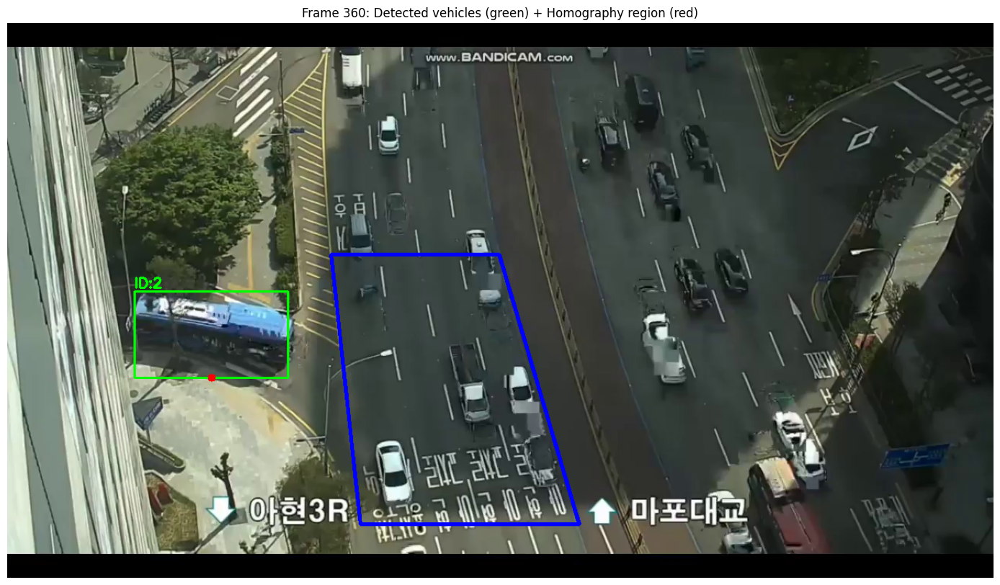

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# 첫 차량 있는 프레임 시각화
non_empty = [f for f in frames_data if len(f['vehicles']) > 0]
if non_empty:
    target_frame = non_empty[len(non_empty)//2]  # 중간 프레임
    frame_id = target_frame['frame_id']

    cap = cv2.VideoCapture(video_path)
    cap.set(cv2.CAP_PROP_POS_FRAMES, frame_id)
    ret, frame = cap.read()
    cap.release()

    if ret:
        # bbox 그리기
        vis = frame.copy()
        for v in target_frame['vehicles']:
            x1, y1, x2, y2 = [int(c) for c in v['bbox_pixel']]
            cv2.rectangle(vis, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(vis, f"ID:{v['track_id']}", (x1, y1-5),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)
            # foot point
            fx, fy = [int(c) for c in v['foot_pixel']]
            cv2.circle(vis, (fx, fy), 5, (0, 0, 255), -1)

        # 빨간 사각형 (호모그래피 영역)
        src_pts_arr = np.array(H_meta['src_pts'], dtype=np.int32)
        cv2.polylines(vis, [src_pts_arr], True, (255, 0, 0), 3)

        plt.figure(figsize=(20, 10))
        plt.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
        plt.title(f'Frame {frame_id}: Detected vehicles (green) + Homography region (red)')
        plt.axis('off')
        plt.show()

검출된 객체: 1개
클래스 분포: {'remote': 1}
신뢰도 평균: 0.09


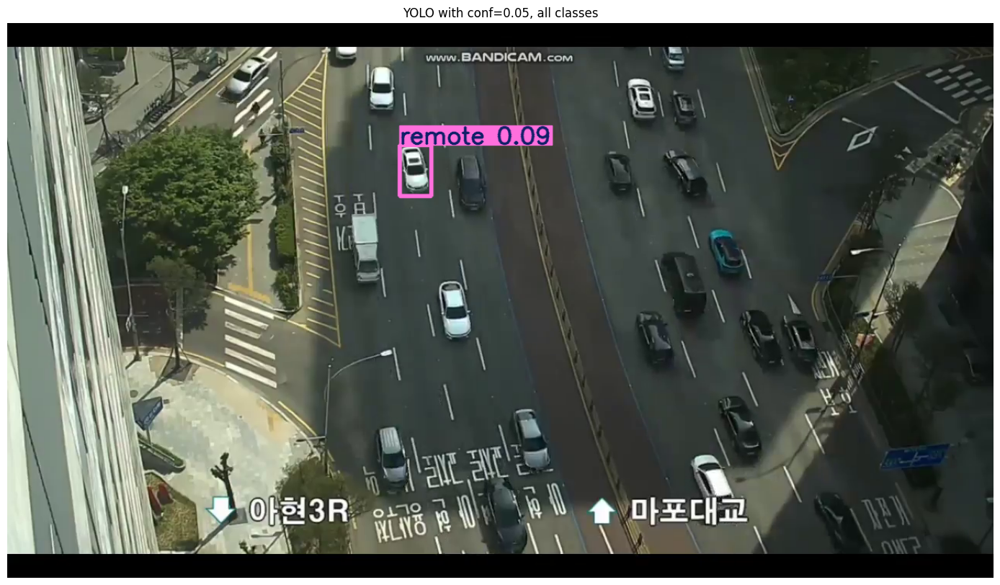

In [ ]:
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO
from collections import Counter

model = YOLO("yolo11n.pt")

# 중간 프레임 가져와서 YOLO 직접 적용 (모든 클래스, 낮은 conf)
cap = cv2.VideoCapture(video_path)
cap.set(cv2.CAP_PROP_POS_FRAMES, 200)
ret, frame = cap.read()
cap.release()

# 모든 클래스, conf 0.05로 낮춰서 확인
results = model(frame, conf=0.05, verbose=False)
r = results[0]

if r.boxes is not None and len(r.boxes) > 0:
    classes = r.boxes.cls.cpu().numpy()
    confs = r.boxes.conf.cpu().numpy()
    names = r.names

    class_counts = Counter([names[int(c)] for c in classes])
    print(f"검출된 객체: {len(r.boxes)}개")
    print(f"클래스 분포: {dict(class_counts)}")
    print(f"신뢰도 평균: {confs.mean():.2f}")
else:
    print("YOLO가 아무것도 못 잡음")

# 시각화
vis = r.plot()
plt.figure(figsize=(20, 10))
plt.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
plt.title('YOLO with conf=0.05, all classes')
plt.axis('off')
plt.show()

###^v03검증용

In [ ]:
### OpenCV 차선 검출 (Hough + 클러스터링) ###
### 각도 분포 확인 ###

import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN

road_only = cv2.imread(f"{VIDEO_BASE}/configs/calibration/road_only.jpg")
h, w = road_only.shape[:2]

src_pts_arr = np.array(H_meta['src_pts'], dtype=np.int32)
mask = np.zeros((h, w), dtype=np.uint8)
cv2.fillPoly(mask, [src_pts_arr], 255)

gray = cv2.cvtColor(road_only, cv2.COLOR_BGR2GRAY)
gray_masked = cv2.bitwise_and(gray, gray, mask=mask)
_, binary = cv2.threshold(gray_masked, 150, 255, cv2.THRESH_BINARY)
kernel = np.ones((3, 3), np.uint8)
binary_clean = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel, iterations=1)
edges = cv2.Canny(binary_clean, 50, 150)
lines = cv2.HoughLinesP(edges, 1, np.pi/180, threshold=40, minLineLength=40, maxLineGap=30)

def line_angle(x1, y1, x2, y2):
    if x2 == x1: return 90
    angle = abs(np.degrees(np.arctan2(y2 - y1, x2 - x1)))
    if angle > 90: angle = 180 - angle
    return angle

print(f"[{VIDEO_ID}] 전체 검출: {len(lines) if lines is not None else 0}개")
if lines is not None:
    angles = [line_angle(l[0][0], l[0][1], l[0][2], l[0][3]) for l in lines]
    print(f"각도 분포: 최소 {min(angles):.0f}°, 최대 {max(angles):.0f}°, 평균 {np.mean(angles):.0f}°")
    print(f"\n각도 히스토그램:")
    for low in range(0, 95, 10):
        count = sum(1 for a in angles if low <= a < low+10)
        bar = '█' * count
        print(f"  {low:3d}° ~ {low+10:3d}°: {bar} ({count})")

[v06] 전체 검출: 60개
각도 분포: 최소 0°, 최대 45°, 평균 33°

각도 히스토그램:
    0° ~  10°: █ (1)
   10° ~  20°:  (0)
   20° ~  30°: ██████████ (10)
   30° ~  40°: ██████████████████████████████████████████████ (46)
   40° ~  50°: ███ (3)
   50° ~  60°:  (0)
   60° ~  70°:  (0)
   70° ~  80°:  (0)
   80° ~  90°:  (0)
   90° ~ 100°:  (0)


필터링된 직선: 57개
클러스터 (차선 후보): 2개
노이즈: 0개

=== 검출된 차선 ===
Lane 1: x_top=888, x_bot=350, 조각=4개
Lane 2: x_top=950, x_bot=483, 조각=53개


/tmp/ipykernel_52932/804423439.py:58: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x_top = int(x0 + t_top * vx)
/tmp/ipykernel_52932/804423439.py:59: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x_bot = int(x0 + t_bot * vx)


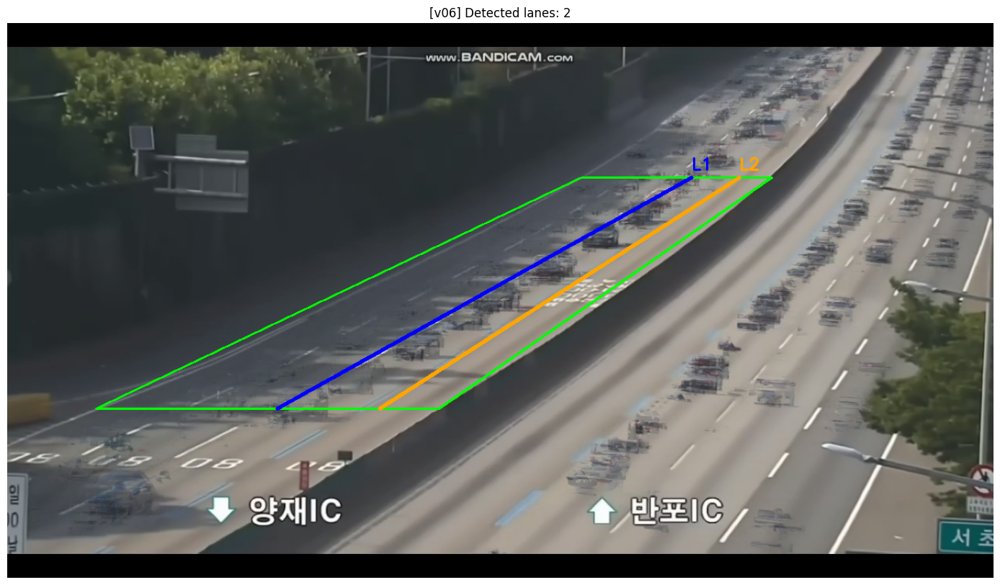


저장: /content/drive/MyDrive/driving2/v06/configs/calibration/opencv_lanes.jpg


In [ ]:
### 필터 + 클러스터링 ###

# 각도 필터 (v06: 25~45도)
filtered_lines = []
for line in lines:
    x1, y1, x2, y2 = line[0]
    if 25 <= line_angle(x1, y1, x2, y2) <= 45:
        filtered_lines.append((x1, y1, x2, y2))

# 클러스터링
mid_y = (src_pts_arr[0][1] + src_pts_arr[2][1]) / 2

def x_at_y(x1, y1, x2, y2, target_y):
    if y2 == y1:
        return (x1 + x2) / 2
    t = (target_y - y1) / (y2 - y1)
    return x1 + t * (x2 - x1)

line_x_centers = []
for (x1, y1, x2, y2) in filtered_lines:
    cx = x_at_y(x1, y1, x2, y2, mid_y)
    line_x_centers.append([cx])

line_x_centers = np.array(line_x_centers)
clustering = DBSCAN(eps=40, min_samples=2).fit(line_x_centers)
labels = clustering.labels_

unique_labels = set(labels) - {-1}
clusters = {}
for label in unique_labels:
    cluster_lines = [filtered_lines[i] for i in range(len(filtered_lines)) if labels[i] == label]
    clusters[label] = cluster_lines

print(f"필터링된 직선: {len(filtered_lines)}개")
print(f"클러스터 (차선 후보): {len(unique_labels)}개")
print(f"노이즈: {sum(1 for l in labels if l == -1)}개")

# 대표 직선
representative_lines = []
for label, cluster_lines in clusters.items():
    all_points = []
    for (x1, y1, x2, y2) in cluster_lines:
        all_points.append([x1, y1])
        all_points.append([x2, y2])
    all_points = np.array(all_points)

    cluster_x_centers = []
    for (x1, y1, x2, y2) in cluster_lines:
        cluster_x_centers.append(x_at_y(x1, y1, x2, y2, mid_y))
    mean_x_at_mid = np.mean(cluster_x_centers)

    [vx, vy, x0, y0] = cv2.fitLine(all_points, cv2.DIST_L2, 0, 0.01, 0.01)

    y_top = src_pts_arr[0][1]
    y_bot = src_pts_arr[2][1]
    t_top = (y_top - y0) / vy
    t_bot = (y_bot - y0) / vy
    x_top = int(x0 + t_top * vx)
    x_bot = int(x0 + t_bot * vx)

    representative_lines.append({
        'x_top': x_top, 'y_top': int(y_top),
        'x_bot': x_bot, 'y_bot': int(y_bot),
        'x_center': mean_x_at_mid,
        'num_pieces': len(cluster_lines)
    })

representative_lines.sort(key=lambda l: l['x_center'])

print(f"\n=== 검출된 차선 ===")
for i, lane in enumerate(representative_lines):
    print(f"Lane {i+1}: x_top={lane['x_top']}, x_bot={lane['x_bot']}, 조각={lane['num_pieces']}개")

# 시각화
vis = road_only.copy()
cv2.polylines(vis, [src_pts_arr], True, (0, 255, 0), 2)

colors = [(255, 0, 0), (0, 165, 255), (0, 255, 255), (255, 0, 255), (255, 255, 0), (0, 100, 255)]
for i, lane in enumerate(representative_lines):
    color = colors[i % len(colors)]
    cv2.line(vis, (lane['x_top'], lane['y_top']), (lane['x_bot'], lane['y_bot']), color, 4)
    cv2.putText(vis, f"L{i+1}", (lane['x_top'], lane['y_top'] - 10),
                cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2)

plt.figure(figsize=(18, 10))
plt.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
plt.title(f'[{VIDEO_ID}] Detected lanes: {len(representative_lines)}')
plt.axis('off')

lanes_vis_path = f"{VIDEO_BASE}/configs/calibration/opencv_lanes.jpg"
plt.savefig(lanes_vis_path, dpi=120, bbox_inches='tight')
plt.show()

# JSON 저장
import json
lanes_data = {
    "video_id": VIDEO_ID,
    "method": "opencv_hough_dbscan",
    "angle_range": "25-45",
    "num_lanes_detected": len(representative_lines),
    "num_lanes_expected": NUM_LANES + 1,
    "lanes": [
        {
            "lane_idx": i,
            "x_top": lane['x_top'], "y_top": lane['y_top'],
            "x_bot": lane['x_bot'], "y_bot": lane['y_bot'],
            "x_center_at_mid_y": lane['x_center'],
            "num_pieces": lane['num_pieces']
        }
        for i, lane in enumerate(representative_lines)
    ]
}
lanes_json_path = f"{VIDEO_BASE}/configs/calibration/lanes_detected.json"
with open(lanes_json_path, 'w') as f:
    json.dump(lanes_data, f, indent=2)

print(f"\n저장: {lanes_vis_path}")

필터링된 직선 (40~55°): 14개
클러스터: 2개
노이즈: 0개

=== 검출된 차선 ===
Lane 1: x_top=746, x_bot=402, x_center=565, 조각=11개
Lane 2: x_top=759, x_bot=540, x_center=650, 조각=3개


/tmp/ipykernel_11476/3541512519.py:87: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x_top = int(x0 + t_top * vx)
/tmp/ipykernel_11476/3541512519.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x_bot = int(x0 + t_bot * vx)
/tmp/ipykernel_11476/3541512519.py:120: UserWarning: Glyph 52264 (\N{HANGUL SYLLABLE CA}) missing from font(s) DejaVu Sans.
  plt.savefig(lanes_vis_path, dpi=120, bbox_inches='tight')
/tmp/ipykernel_11476/3541512519.py:120: UserWarning: Glyph 49440 (\N{HANGUL SYLLABLE SEON}) missing from font(s) DejaVu Sans.
  plt.savefig(lanes_vis_path, dpi=120, bbox_inches='tight')
/tmp/ipykernel_11476/3541512519.py:120: UserWarn

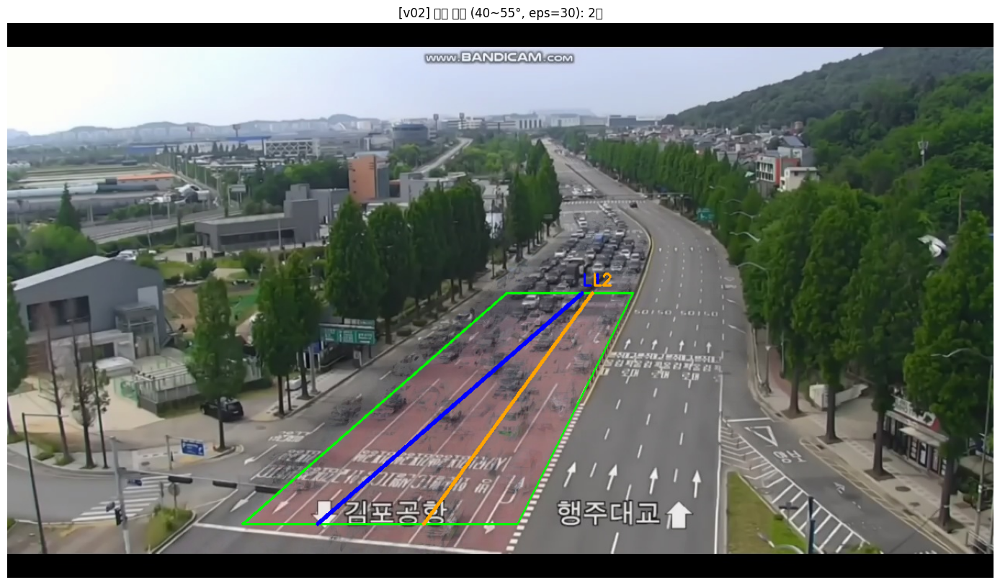

In [ ]:
### 필터 + 클러스터링 ###_시도3
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
import json

road_only = cv2.imread(f"{VIDEO_BASE}/configs/calibration/road_only.jpg")
h, w = road_only.shape[:2]

src_pts_arr = np.array(H_meta['src_pts'], dtype=np.int32)
mask = np.zeros((h, w), dtype=np.uint8)
cv2.fillPoly(mask, [src_pts_arr], 255)

gray = cv2.cvtColor(road_only, cv2.COLOR_BGR2GRAY)
gray_masked = cv2.bitwise_and(gray, gray, mask=mask)

# 원래 임계값 (150)
_, binary = cv2.threshold(gray_masked, 150, 255, cv2.THRESH_BINARY)

kernel = np.ones((3, 3), np.uint8)
binary_clean = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel, iterations=1)
edges = cv2.Canny(binary_clean, 50, 150)
lines = cv2.HoughLinesP(edges, 1, np.pi/180, threshold=40, minLineLength=40, maxLineGap=30)

def line_angle(x1, y1, x2, y2):
    if x2 == x1: return 90
    angle = abs(np.degrees(np.arctan2(y2 - y1, x2 - x1)))
    if angle > 90: angle = 180 - angle
    return angle

# 각도 필터 (40~55도로 좁힘)
filtered_lines = []
for line in lines:
    x1, y1, x2, y2 = line[0]
    if 40 <= line_angle(x1, y1, x2, y2) <= 55:
        filtered_lines.append((x1, y1, x2, y2))

# 클러스터링 (eps 30으로 줄임)
mid_y = (src_pts_arr[0][1] + src_pts_arr[2][1]) / 2

def x_at_y(x1, y1, x2, y2, target_y):
    if y2 == y1:
        return (x1 + x2) / 2
    t = (target_y - y1) / (y2 - y1)
    return x1 + t * (x2 - x1)

line_x_centers = []
for (x1, y1, x2, y2) in filtered_lines:
    cx = x_at_y(x1, y1, x2, y2, mid_y)
    line_x_centers.append([cx])

line_x_centers = np.array(line_x_centers)
clustering = DBSCAN(eps=30, min_samples=1).fit(line_x_centers)  # eps 40→30, min_samples 2→1
labels = clustering.labels_

unique_labels = set(labels) - {-1}
clusters = {}
for label in unique_labels:
    cluster_lines = [filtered_lines[i] for i in range(len(filtered_lines)) if labels[i] == label]
    clusters[label] = cluster_lines

print(f"필터링된 직선 (40~55°): {len(filtered_lines)}개")
print(f"클러스터: {len(unique_labels)}개")
print(f"노이즈: {sum(1 for l in labels if l == -1)}개")

# 대표 직선
representative_lines = []
for label, cluster_lines in clusters.items():
    all_points = []
    for (x1, y1, x2, y2) in cluster_lines:
        all_points.append([x1, y1])
        all_points.append([x2, y2])
    all_points = np.array(all_points)

    cluster_x_centers = []
    for (x1, y1, x2, y2) in cluster_lines:
        cluster_x_centers.append(x_at_y(x1, y1, x2, y2, mid_y))
    mean_x_at_mid = np.mean(cluster_x_centers)

    [vx, vy, x0, y0] = cv2.fitLine(all_points, cv2.DIST_L2, 0, 0.01, 0.01)

    y_top = src_pts_arr[0][1]
    y_bot = src_pts_arr[2][1]
    t_top = (y_top - y0) / vy
    t_bot = (y_bot - y0) / vy
    x_top = int(x0 + t_top * vx)
    x_bot = int(x0 + t_bot * vx)

    representative_lines.append({
        'x_top': x_top, 'y_top': int(y_top),
        'x_bot': x_bot, 'y_bot': int(y_bot),
        'x_center': mean_x_at_mid,
        'num_pieces': len(cluster_lines)
    })

representative_lines.sort(key=lambda l: l['x_center'])

print(f"\n=== 검출된 차선 ===")
for i, lane in enumerate(representative_lines):
    print(f"Lane {i+1}: x_top={lane['x_top']}, x_bot={lane['x_bot']}, x_center={lane['x_center']:.0f}, 조각={lane['num_pieces']}개")

# 시각화
vis = road_only.copy()
cv2.polylines(vis, [src_pts_arr], True, (0, 255, 0), 2)

colors = [(255, 0, 0), (0, 165, 255), (0, 255, 255), (255, 0, 255), (255, 255, 0), (0, 100, 255), (255, 100, 0)]
for i, lane in enumerate(representative_lines):
    color = colors[i % len(colors)]
    cv2.line(vis, (lane['x_top'], lane['y_top']), (lane['x_bot'], lane['y_bot']), color, 4)
    cv2.putText(vis, f"L{i+1}", (lane['x_top'], lane['y_top'] - 10),
                cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2)

plt.figure(figsize=(18, 10))
plt.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
plt.title(f'[{VIDEO_ID}] 차선 검출 (40~55°, eps=30): {len(representative_lines)}개')
plt.axis('off')

lanes_vis_path = f"{VIDEO_BASE}/configs/calibration/opencv_lanes_v3.jpg"
plt.savefig(lanes_vis_path, dpi=120, bbox_inches='tight')
plt.show()

### 차선 검출 결과가 안좋아서, 프레임 추출 다시한 후 깨끗한 read_only새로 만들고 거기서 차선검출 다시 시도

/tmp/ipykernel_11476/1704735453.py:28: UserWarning: Glyph 52488 (\N{HANGUL SYLLABLE CO}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 52488 (\N{HANGUL SYLLABLE CO}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


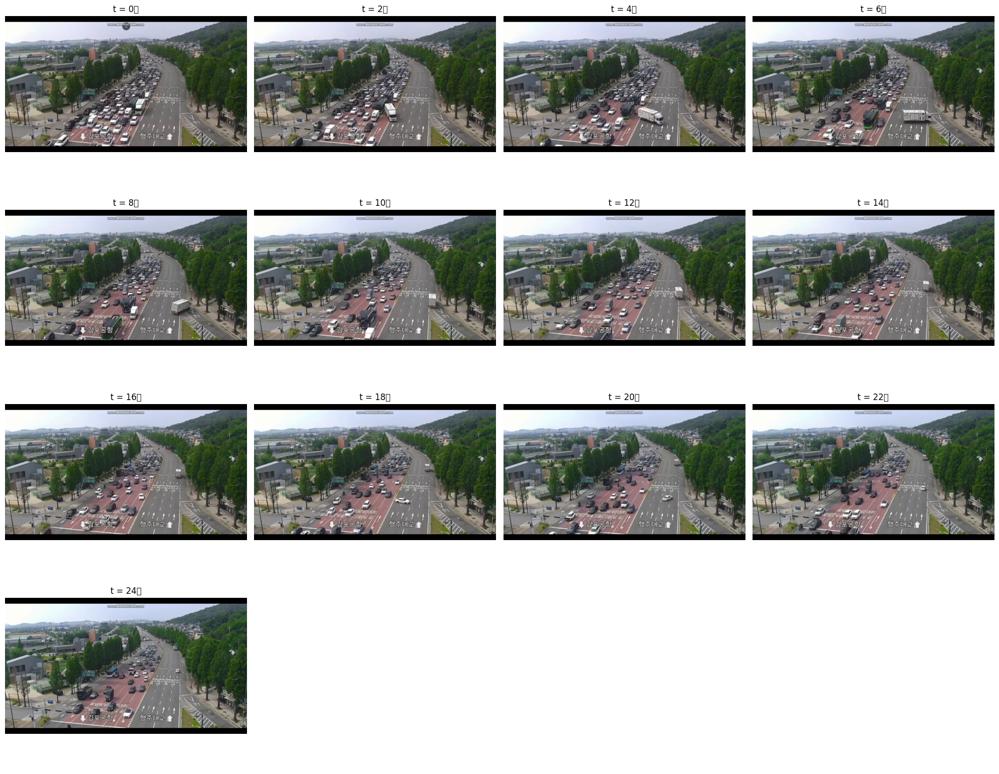

영상 길이: 25.3초
차량이 가장 적은 시점을 알려줘 (예: 't=10초 부근')


In [ ]:
### 영상 미리보기 셀 ###

import cv2
import matplotlib.pyplot as plt

cap = cv2.VideoCapture(video_path)
total = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
fps = cap.get(cv2.CAP_PROP_FPS)
duration = total / fps

# 1초 간격으로 프레임 추출
sample_times = list(range(0, int(duration) + 1, 2))  # 0, 2, 4, ... 초
fig, axes = plt.subplots((len(sample_times)+3)//4, 4, figsize=(20, 4*((len(sample_times)+3)//4)))
axes = axes.flatten()

for i, t in enumerate(sample_times):
    cap.set(cv2.CAP_PROP_POS_FRAMES, int(t * fps))
    ret, frame = cap.read()
    if ret:
        axes[i].imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        axes[i].set_title(f't = {t}초')
        axes[i].axis('off')

for j in range(len(sample_times), len(axes)):
    axes[j].axis('off')

cap.release()
plt.tight_layout()
plt.show()

print(f"영상 길이: {duration:.1f}초")
print(f"차량이 가장 적은 시점을 알려줘 (예: 't=10초 부근')")

수집된 프레임: 84개 (18.0~25.0초)


/tmp/ipykernel_11476/3781374947.py:53: UserWarning: Glyph 44592 (\N{HANGUL SYLLABLE GI}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_11476/3781374947.py:53: UserWarning: Glyph 51316 (\N{HANGUL SYLLABLE JON}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_11476/3781374947.py:53: UserWarning: Glyph 50689 (\N{HANGUL SYLLABLE YEONG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_11476/3781374947.py:53: UserWarning: Glyph 49345 (\N{HANGUL SYLLABLE SANG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_11476/3781374947.py:53: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_11476/3781374947.py:53: UserWarning: Glyph 52404 (\N{HANGUL SYLLABLE CE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_11476/3781374947.py:53: UserWarning: Glyph 49368 (\N{HANGUL SYLLABLE SAEM}) missing from font(s) DejaVu Sans.
  p

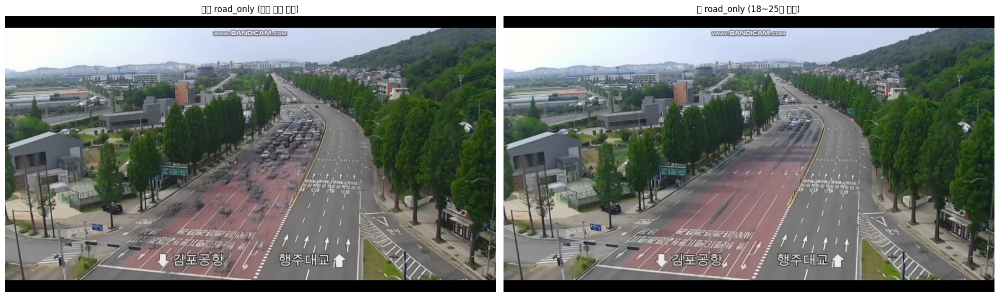


✅ 새 road_only 저장 완료
   기존: /content/drive/MyDrive/driving2/v02/configs/calibration/road_only_old.jpg (백업)
   신규: /content/drive/MyDrive/driving2/v02/configs/calibration/road_only.jpg


In [ ]:
### 새 read_only 만들기 ###

import cv2
import numpy as np
import matplotlib.pyplot as plt
import shutil

# 깨끗한 구간
START_TIME = 18.0
END_TIME = 25.0

cap = cv2.VideoCapture(video_path)
fps_video_local = cap.get(cv2.CAP_PROP_FPS)
total_frames_local = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

start_frame = int(START_TIME * fps_video_local)
end_frame = min(int(END_TIME * fps_video_local), total_frames_local)

# 그 구간의 프레임 수집 (2프레임씩 샘플링)
frames = []
for frame_idx in range(start_frame, end_frame, 2):
    cap.set(cv2.CAP_PROP_POS_FRAMES, frame_idx)
    ret, frame = cap.read()
    if ret:
        frames.append(frame.astype(np.float32))
cap.release()

print(f"수집된 프레임: {len(frames)}개 ({START_TIME}~{END_TIME}초)")

if len(frames) < 5:
    print("⚠️ 프레임 너무 적음. 구간 더 넓게.")
else:
    # 중앙값으로 차량 제거
    road_only_new = np.median(np.stack(frames), axis=0).astype(np.uint8)

    # 기존 백업
    old_path = f"{VIDEO_BASE}/configs/calibration/road_only.jpg"
    backup_path = f"{VIDEO_BASE}/configs/calibration/road_only_old.jpg"
    shutil.copy(old_path, backup_path)

    # 새 road_only 저장
    cv2.imwrite(old_path, road_only_new)

    # 비교 시각화
    old = cv2.imread(backup_path)
    fig, axes = plt.subplots(1, 2, figsize=(20, 8))
    axes[0].imshow(cv2.cvtColor(old, cv2.COLOR_BGR2RGB))
    axes[0].set_title('기존 road_only (영상 전체 샘플)')
    axes[0].axis('off')
    axes[1].imshow(cv2.cvtColor(road_only_new, cv2.COLOR_BGR2RGB))
    axes[1].set_title(f'새 road_only ({START_TIME:.0f}~{END_TIME:.0f}초 구간)')
    axes[1].axis('off')
    plt.tight_layout()
    plt.savefig(f"{VIDEO_BASE}/configs/calibration/road_only_compare.jpg", dpi=120, bbox_inches='tight')
    plt.show()

    print(f"\n✅ 새 road_only 저장 완료")
    print(f"   기존: {backup_path} (백업)")
    print(f"   신규: {old_path}")

In [ ]:
### 각도 히스토그램 ###
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN

road_only = cv2.imread(f"{VIDEO_BASE}/configs/calibration/road_only.jpg")  # 새 road_only
h, w = road_only.shape[:2]

src_pts_arr = np.array(H_meta['src_pts'], dtype=np.int32)
mask = np.zeros((h, w), dtype=np.uint8)
cv2.fillPoly(mask, [src_pts_arr], 255)

gray = cv2.cvtColor(road_only, cv2.COLOR_BGR2GRAY)
gray_masked = cv2.bitwise_and(gray, gray, mask=mask)
_, binary = cv2.threshold(gray_masked, 150, 255, cv2.THRESH_BINARY)
kernel = np.ones((3, 3), np.uint8)
binary_clean = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel, iterations=1)
edges = cv2.Canny(binary_clean, 50, 150)
lines = cv2.HoughLinesP(edges, 1, np.pi/180, threshold=40, minLineLength=40, maxLineGap=30)

def line_angle(x1, y1, x2, y2):
    if x2 == x1: return 90
    angle = abs(np.degrees(np.arctan2(y2 - y1, x2 - x1)))
    if angle > 90: angle = 180 - angle
    return angle

print(f"[v02 새 road_only] 전체 검출: {len(lines) if lines is not None else 0}개")
if lines is not None:
    angles = [line_angle(l[0][0], l[0][1], l[0][2], l[0][3]) for l in lines]
    print(f"각도 분포: 최소 {min(angles):.0f}°, 최대 {max(angles):.0f}°, 평균 {np.mean(angles):.0f}°")
    print(f"\n각도 히스토그램:")
    for low in range(0, 95, 10):
        count = sum(1 for a in angles if low <= a < low+10)
        bar = '█' * count
        print(f"  {low:3d}° ~ {low+10:3d}°: {bar} ({count})")

[v02 새 road_only] 전체 검출: 40개
각도 분포: 최소 0°, 최대 59°, 평균 21°

각도 히스토그램:
    0° ~  10°: ████████████████████████ (24)
   10° ~  20°: █ (1)
   20° ~  30°:  (0)
   30° ~  40°:  (0)
   40° ~  50°: ████████ (8)
   50° ~  60°: ███████ (7)
   60° ~  70°:  (0)
   70° ~  80°:  (0)
   80° ~  90°:  (0)
   90° ~ 100°:  (0)


필터링된 직선: 15개
클러스터: 3개

=== 검출된 차선 ===
Lane 1: x_top=742, x_bot=400, 조각=9개
Lane 2: x_top=758, x_bot=540, 조각=2개
Lane 3: x_top=787, x_bot=612, 조각=4개


/tmp/ipykernel_11476/3034282922.py:56: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x_top = int(x0 + t_top * vx)
/tmp/ipykernel_11476/3034282922.py:57: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x_bot = int(x0 + t_bot * vx)
/tmp/ipykernel_11476/3034282922.py:89: UserWarning: Glyph 49352 (\N{HANGUL SYLLABLE SAE}) missing from font(s) DejaVu Sans.
  plt.savefig(lanes_vis_path, dpi=120, bbox_inches='tight')
/tmp/ipykernel_11476/3034282922.py:89: UserWarning: Glyph 52264 (\N{HANGUL SYLLABLE CA}) missing from font(s) DejaVu Sans.
  plt.savefig(lanes_vis_path, dpi=120, bbox_inches='tight')
/tmp/ipykernel_11476/3034282922.py:89: UserWarning:

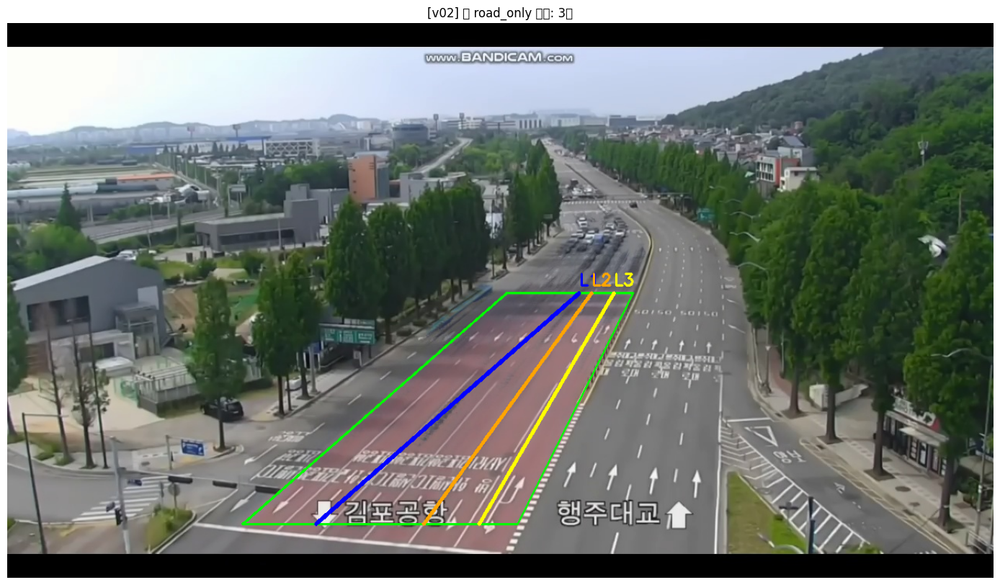


저장 (기존 덮어쓰기): /content/drive/MyDrive/driving2/v02/configs/calibration/opencv_lanes.jpg


In [ ]:
### 차선검출 ###
# 각도 필터 (40~60도)
filtered_lines = []
for line in lines:
    x1, y1, x2, y2 = line[0]
    if 40 <= line_angle(x1, y1, x2, y2) <= 60:
        filtered_lines.append((x1, y1, x2, y2))

# 클러스터링
mid_y = (src_pts_arr[0][1] + src_pts_arr[2][1]) / 2

def x_at_y(x1, y1, x2, y2, target_y):
    if y2 == y1:
        return (x1 + x2) / 2
    t = (target_y - y1) / (y2 - y1)
    return x1 + t * (x2 - x1)

line_x_centers = []
for (x1, y1, x2, y2) in filtered_lines:
    cx = x_at_y(x1, y1, x2, y2, mid_y)
    line_x_centers.append([cx])

line_x_centers = np.array(line_x_centers)
clustering = DBSCAN(eps=40, min_samples=2).fit(line_x_centers)
labels = clustering.labels_

unique_labels = set(labels) - {-1}
clusters = {}
for label in unique_labels:
    cluster_lines = [filtered_lines[i] for i in range(len(filtered_lines)) if labels[i] == label]
    clusters[label] = cluster_lines

print(f"필터링된 직선: {len(filtered_lines)}개")
print(f"클러스터: {len(unique_labels)}개")

# 대표 직선
representative_lines = []
for label, cluster_lines in clusters.items():
    all_points = []
    for (x1, y1, x2, y2) in cluster_lines:
        all_points.append([x1, y1])
        all_points.append([x2, y2])
    all_points = np.array(all_points)

    cluster_x_centers = []
    for (x1, y1, x2, y2) in cluster_lines:
        cluster_x_centers.append(x_at_y(x1, y1, x2, y2, mid_y))
    mean_x_at_mid = np.mean(cluster_x_centers)

    [vx, vy, x0, y0] = cv2.fitLine(all_points, cv2.DIST_L2, 0, 0.01, 0.01)

    y_top = src_pts_arr[0][1]
    y_bot = src_pts_arr[2][1]
    t_top = (y_top - y0) / vy
    t_bot = (y_bot - y0) / vy
    x_top = int(x0 + t_top * vx)
    x_bot = int(x0 + t_bot * vx)

    representative_lines.append({
        'x_top': x_top, 'y_top': int(y_top),
        'x_bot': x_bot, 'y_bot': int(y_bot),
        'x_center': mean_x_at_mid,
        'num_pieces': len(cluster_lines)
    })

representative_lines.sort(key=lambda l: l['x_center'])

print(f"\n=== 검출된 차선 ===")
for i, lane in enumerate(representative_lines):
    print(f"Lane {i+1}: x_top={lane['x_top']}, x_bot={lane['x_bot']}, 조각={lane['num_pieces']}개")

# 시각화
vis = road_only.copy()
cv2.polylines(vis, [src_pts_arr], True, (0, 255, 0), 2)

colors = [(255, 0, 0), (0, 165, 255), (0, 255, 255), (255, 0, 255), (255, 255, 0), (0, 100, 255), (255, 100, 0)]
for i, lane in enumerate(representative_lines):
    color = colors[i % len(colors)]
    cv2.line(vis, (lane['x_top'], lane['y_top']), (lane['x_bot'], lane['y_bot']), color, 4)
    cv2.putText(vis, f"L{i+1}", (lane['x_top'], lane['y_top'] - 10),
                cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2)

plt.figure(figsize=(18, 10))
plt.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
plt.title(f'[{VIDEO_ID}] 새 road_only 차선: {len(representative_lines)}개')
plt.axis('off')

lanes_vis_path = f"{VIDEO_BASE}/configs/calibration/opencv_lanes.jpg"  # 기존 파일 덮어쓰기
plt.savefig(lanes_vis_path, dpi=120, bbox_inches='tight')
plt.show()

# JSON 저장 (기존 덮어쓰기)
import json
lanes_data = {
    "video_id": VIDEO_ID,
    "method": "opencv_hough_dbscan",
    "angle_range": "40-60",
    "num_lanes_detected": len(representative_lines),
    "num_lanes_expected": NUM_LANES + 1,
    "note": f"road_only made from clean segment ({18}~{25}s)",
    "lanes": [
        {
            "lane_idx": i,
            "x_top": lane['x_top'], "y_top": lane['y_top'],
            "x_bot": lane['x_bot'], "y_bot": lane['y_bot'],
            "x_center_at_mid_y": lane['x_center'],
            "num_pieces": lane['num_pieces']
        }
        for i, lane in enumerate(representative_lines)
    ]
}
lanes_json_path = f"{VIDEO_BASE}/configs/calibration/lanes_detected.json"
with open(lanes_json_path, 'w') as f:
    json.dump(lanes_data, f, indent=2)

print(f"\n저장 (기존 덮어쓰기): {lanes_vis_path}")

### 차선검출 재시도 했으나 실패...###

In [ ]:
### 신뢰도 정보 추가 ###

import json

# 신뢰도 추가
with open(f"{VIDEO_BASE}/configs/calibration/lanes_detected.json", 'r') as f:
    lanes_data = json.load(f)

lanes_data['reliability'] = 'medium'
lanes_data['note'] = '4차로 분리선 3개 중 2개 검출. 도로 양 끝 실선은 OpenCV 한계로 미검출. 호모그래피 기반 lane_id로 4차로 분석 정상 수행.'

with open(f"{VIDEO_BASE}/configs/calibration/lanes_detected.json", 'w') as f:
    json.dump(lanes_data, f, indent=2, ensure_ascii=False)

print("✅ 신뢰도 정보 추가")

✅ 신뢰도 정보 추가


In [ ]:
### v01 영상 검증 보고서 만들기 ###

import json
import numpy as np
from collections import defaultdict
from datetime import datetime

# 결과 로드
with open(f"{VIDEO_BASE}/outputs/test_tracks_v1.1.json", 'r') as f:
    data = json.load(f)

with open(f"{VIDEO_BASE}/configs/calibration/H_meta.json", 'r') as f:
    H_meta = json.load(f)

# 차선 검출 결과 (있으면)
lanes_path = f"{VIDEO_BASE}/configs/calibration/lanes_detected.json"
import os
lanes_data = None
if os.path.exists(lanes_path):
    with open(lanes_path, 'r') as f:
        lanes_data = json.load(f)

# 통계 계산
track_data = defaultdict(lambda: {'positions': [], 'speeds': [], 'lanes': [], 'frames': []})
for frame in data['frames']:
    for v in frame['vehicles']:
        tid = v['track_id']
        track_data[tid]['positions'].append(v['position_road_m'])
        track_data[tid]['speeds'].append(v['speed_est_mps'])
        track_data[tid]['lanes'].append(v['lane_id'])
        track_data[tid]['frames'].append(frame['frame_id'])

total_frames = data['total_frames']
fps = data['fps']
unique_tracks = len(track_data)
total_instances = sum(len(t['positions']) for t in track_data.values())

# 차로 분포
lane_count = defaultdict(int)
for t in track_data.values():
    for lane in t['lanes']:
        lane_count[lane] += 1

# 속도
all_speeds = []
for t in track_data.values():
    all_speeds.extend([s for s in t['speeds'][1:] if s > 0])
speeds_array = np.array(all_speeds) if all_speeds else np.array([0])

# 위치
all_x = [p[0] for t in track_data.values() for p in t['positions']]
all_y = [p[1] for t in track_data.values() for p in t['positions']]
x_arr = np.array(all_x) if all_x else np.array([0])
y_arr = np.array(all_y) if all_y else np.array([0])

# 잘 추적된 차량
long_tracks = [(tid, t) for tid, t in track_data.items()
               if (t['frames'][-1] - t['frames'][0]) / fps >= 3.0]

# === 마크다운 보고서 작성 ===
lines = []
lines.append(f"# {VIDEO_ID} 검증 보고서\n")
lines.append(f"**생성:** {datetime.now().strftime('%Y-%m-%d %H:%M')}")
lines.append(f"**영상 파일:** `{VIDEO_FILE}`")
lines.append(f"**해상도:** 1280×720, {fps:.1f}fps, {total_frames}프레임 ({total_frames/fps:.1f}초)")
lines.append(f"**도로:** {H_meta['num_lanes']}차로 ({H_meta['road_width_m']}m), 버스 전용 차로(4차선) 제외")
lines.append(f"**환경:** 도시 교차로 CCTV (강서구청 근처)\n")

lines.append("## 호모그래피 캘리브레이션\n")
lines.append("### 4점 좌표\n")
lines.append("| 점 | 픽셀 (x, y) | 미터 (x, y) |")
lines.append("|---|---|---|")
descs = ["멀리 왼쪽", "멀리 오른쪽", "가까이 오른쪽", "가까이 왼쪽"]
for i, (sp, dp, desc) in enumerate(zip(H_meta['src_pts'], H_meta['dst_pts'], descs)):
    lines.append(f"| P{i+1} ({desc}) | ({sp[0]:.0f}, {sp[1]:.0f}) | ({dp[0]:.1f}, {dp[1]:.1f}) |")
lines.append("")

lines.append("## 차량 검출 통계\n")
lines.append(f"- **총 프레임:** {total_frames}")
lines.append(f"- **Unique 차량:** {unique_tracks}대")
lines.append(f"- **총 검출 인스턴스:** {total_instances}개")
lines.append(f"- **3초 이상 추적된 차량:** {len(long_tracks)}대\n")

lines.append("## 차로 분포\n")
lines.append("| 차로 | 검출 인스턴스 | 비율 |")
lines.append("|---|---|---|")
for lane_id in sorted(lane_count.keys()):
    count = lane_count[lane_id]
    ratio = count / total_instances * 100
    note = ""
    if lane_id == 0:
        note = " (도로 왼쪽 밖)"
    elif lane_id > H_meta['num_lanes']:
        note = " (도로 오른쪽 밖 - 버스 전용/대기 차량)"
    lines.append(f"| {lane_id}{note} | {count} | {ratio:.1f}% |")

valid_pct = sum(c for l, c in lane_count.items() if 1 <= l <= H_meta['num_lanes']) / total_instances * 100
lines.append(f"\n**분석 대상 영역 (1~{H_meta['num_lanes']}차로) 내 검출 비율:** {valid_pct:.1f}%\n")

lines.append("## 속도 분포\n")
lines.append("| 항목 | m/s | km/h |")
lines.append("|---|---|---|")
lines.append(f"| 최소 | {speeds_array.min():.2f} | {speeds_array.min()*3.6:.1f} |")
lines.append(f"| 평균 | {speeds_array.mean():.2f} | {speeds_array.mean()*3.6:.1f} |")
lines.append(f"| 중앙값 | {np.median(speeds_array):.2f} | {np.median(speeds_array)*3.6:.1f} |")
lines.append(f"| 최대 | {speeds_array.max():.2f} | {speeds_array.max()*3.6:.1f} |")
lines.append(f"\n**참고:** 도시 도로 + 신호 정체 환경 (어제 터널 영상 47km/h 대비 낮음)\n")

lines.append("## 위치 분포\n")
lines.append("| 축 | 범위 (m) | 의미 |")
lines.append("|---|---|---|")
lines.append(f"| x (가로) | {x_arr.min():.2f} ~ {x_arr.max():.2f} | 도로 가로 폭 0~{H_meta['road_width_m']}m |")
lines.append(f"| y (세로) | {y_arr.min():.2f} ~ {y_arr.max():.2f} | 호모그래피 영역 0~{H_meta['segment_length_m']}m |")
lines.append("")

if lanes_data:
    lines.append("## 차선 검출 (OpenCV)\n")
    lines.append(f"- **검출 방법:** {lanes_data['method']}")
    lines.append(f"- **검출된 차선:** {lanes_data['num_lanes_detected']}개")
    lines.append(f"- **기대 차선:** {lanes_data['num_lanes_expected']}개 (도로 경계 + 차로 분리선)")
    lines.append(f"\n**한계:** 도로 양 끝 실선은 검출되지 않았고 차로 사이 점선 분리선만 검출됨. ")
    lines.append("호모그래피 영역의 가장자리가 도로 양 끝 역할을 대신하므로 분석에는 문제 없음.\n")

lines.append("## 종합 평가\n")
lines.append(f"- ✅ **호모그래피 정상 동작**: 4점 자기검증 통과")
lines.append(f"- ✅ **차로 분포 합리적**: 1~3차로 균등 분포")
lines.append(f"- ✅ **속도 합리적**: 도시 도로 환경 반영")
lines.append(f"- ⚠️ **도로 밖 검출**: 약 40% (영상 환경 특성, 교차로/다른 도로 차량 포함)")
if lanes_data:
    lines.append(f"- ⚠️ **차선 검출 부분 한계**: {lanes_data['num_lanes_detected']}개만 검출")
lines.append("")

lines.append("## 산출물\n")
lines.append(f"- `outputs/test_tracks_v1.1.json` — 핵심 데이터")
lines.append(f"- `configs/calibration/H_matrix.npy` — 호모그래피 행렬")
lines.append(f"- `configs/calibration/H_meta.json` — 캘리브레이션 메타")
lines.append(f"- `configs/calibration/bev_check.jpg` — BEV 검증 이미지")
if lanes_data:
    lines.append(f"- `configs/calibration/lanes_detected.json` — 차선 검출 결과")
    lines.append(f"- `configs/calibration/opencv_lanes.jpg` — 차선 검출 시각화")

report_content = "\n".join(lines)
report_path = f"{VIDEO_BASE}/outputs/reports/validation_{VIDEO_ID}.md"
os.makedirs(os.path.dirname(report_path), exist_ok=True)
with open(report_path, 'w', encoding='utf-8') as f:
    f.write(report_content)

print(f"✅ 검증 보고서 저장: {report_path}")

✅ 검증 보고서 저장: /content/drive/MyDrive/driving2/v01/outputs/reports/validation_v01.md


In [ ]:
### v02 검증보고서 ###

import json
import numpy as np
from collections import defaultdict
from datetime import datetime
import os

# 결과 로드
with open(f"{VIDEO_BASE}/outputs/test_tracks_v1.1.json", 'r') as f:
    data = json.load(f)

with open(f"{VIDEO_BASE}/configs/calibration/H_meta.json", 'r') as f:
    H_meta = json.load(f)

# 차선 검출 결과
lanes_path = f"{VIDEO_BASE}/configs/calibration/lanes_detected.json"
lanes_data = None
if os.path.exists(lanes_path):
    with open(lanes_path, 'r') as f:
        lanes_data = json.load(f)

# 통계 계산
track_data = defaultdict(lambda: {'positions': [], 'speeds': [], 'lanes': [], 'frames': []})
for frame in data['frames']:
    for v in frame['vehicles']:
        tid = v['track_id']
        track_data[tid]['positions'].append(v['position_road_m'])
        track_data[tid]['speeds'].append(v['speed_est_mps'])
        track_data[tid]['lanes'].append(v['lane_id'])
        track_data[tid]['frames'].append(frame['frame_id'])

total_frames = data['total_frames']
fps = data['fps']
unique_tracks = len(track_data)
total_instances = sum(len(t['positions']) for t in track_data.values())

# 차로 분포
lane_count = defaultdict(int)
for t in track_data.values():
    for lane in t['lanes']:
        lane_count[lane] += 1

# 속도
all_speeds = []
for t in track_data.values():
    all_speeds.extend([s for s in t['speeds'][1:] if s > 0])
speeds_array = np.array(all_speeds) if all_speeds else np.array([0])

# 위치
all_x = [p[0] for t in track_data.values() for p in t['positions']]
all_y = [p[1] for t in track_data.values() for p in t['positions']]
x_arr = np.array(all_x) if all_x else np.array([0])
y_arr = np.array(all_y) if all_y else np.array([0])

# 잘 추적된 차량
long_tracks = [(tid, t) for tid, t in track_data.items()
               if (t['frames'][-1] - t['frames'][0]) / fps >= 3.0]

# === 마크다운 보고서 작성 ===
lines = []
lines.append(f"# {VIDEO_ID} 검증 보고서\n")
lines.append(f"**생성:** {datetime.now().strftime('%Y-%m-%d %H:%M')}")
lines.append(f"**영상 파일:** `{VIDEO_FILE}`")
lines.append(f"**해상도:** 1280×720, {fps:.1f}fps, {total_frames}프레임 ({total_frames/fps:.1f}초)")
lines.append(f"**도로:** {H_meta['num_lanes']}차로 ({H_meta['road_width_m']}m), 흰 마킹 없는 차로 1개 제외")
lines.append(f"**환경:** 김포공항 근처 직선 도로 (정체)\n")

lines.append("## 호모그래피 캘리브레이션\n")
lines.append("### 4점 좌표\n")
lines.append("| 점 | 픽셀 (x, y) | 미터 (x, y) |")
lines.append("|---|---|---|")
descs = ["멀리 왼쪽", "멀리 오른쪽", "가까이 오른쪽", "가까이 왼쪽"]
for i, (sp, dp, desc) in enumerate(zip(H_meta['src_pts'], H_meta['dst_pts'], descs)):
    lines.append(f"| P{i+1} ({desc}) | ({sp[0]:.0f}, {sp[1]:.0f}) | ({dp[0]:.1f}, {dp[1]:.1f}) |")
lines.append("")
lines.append(f"**호모그래피 영역:** {H_meta['road_width_m']}m × {H_meta['segment_length_m']}m\n")

lines.append("## 차량 검출 통계\n")
lines.append(f"- **총 프레임:** {total_frames}")
lines.append(f"- **Unique 차량:** {unique_tracks}대")
lines.append(f"- **총 검출 인스턴스:** {total_instances}개")
lines.append(f"- **3초 이상 추적된 차량:** {len(long_tracks)}대\n")

lines.append("## 차로 분포\n")
lines.append("| 차로 | 검출 인스턴스 | 비율 |")
lines.append("|---|---|---|")
for lane_id in sorted(lane_count.keys()):
    count = lane_count[lane_id]
    ratio = count / total_instances * 100
    note = ""
    if lane_id == 0:
        note = " (도로 왼쪽 밖)"
    elif lane_id > H_meta['num_lanes']:
        note = " (도로 오른쪽 밖)"
    lines.append(f"| {lane_id}{note} | {count} | {ratio:.1f}% |")

valid_pct = sum(c for l, c in lane_count.items() if 1 <= l <= H_meta['num_lanes']) / total_instances * 100
lines.append(f"\n**분석 대상 영역 (1~{H_meta['num_lanes']}차로) 내 검출 비율:** {valid_pct:.1f}%\n")

lines.append("## 속도 분포\n")
lines.append("| 항목 | m/s | km/h |")
lines.append("|---|---|---|")
lines.append(f"| 최소 | {speeds_array.min():.2f} | {speeds_array.min()*3.6:.1f} |")
lines.append(f"| 평균 | {speeds_array.mean():.2f} | {speeds_array.mean()*3.6:.1f} |")
lines.append(f"| 중앙값 | {np.median(speeds_array):.2f} | {np.median(speeds_array)*3.6:.1f} |")
lines.append(f"| 최대 | {speeds_array.max():.2f} | {speeds_array.max()*3.6:.1f} |")
lines.append(f"\n**참고:** 정체 영상으로 평균 속도 낮음. 정상 동작.\n")

lines.append("## 위치 분포\n")
lines.append("| 축 | 범위 (m) | 의미 |")
lines.append("|---|---|---|")
lines.append(f"| x (가로) | {x_arr.min():.2f} ~ {x_arr.max():.2f} | 도로 가로 폭 0~{H_meta['road_width_m']}m |")
lines.append(f"| y (세로) | {y_arr.min():.2f} ~ {y_arr.max():.2f} | 호모그래피 영역 0~{H_meta['segment_length_m']}m |")
lines.append("")

if lanes_data:
    lines.append("## 차선 검출 (OpenCV)\n")
    lines.append(f"- **검출 방법:** {lanes_data['method']}")
    lines.append(f"- **검출된 차선:** {lanes_data['num_lanes_detected']}개")
    lines.append(f"- **기대 차선:** {lanes_data['num_lanes_expected']}개")
    if 'reliability' in lanes_data:
        lines.append(f"- **신뢰도:** {lanes_data['reliability']}")
    if 'note' in lanes_data:
        lines.append(f"- **비고:** {lanes_data['note']}")

    if 'attempts' in lanes_data:
        lines.append(f"\n### 시도 기록\n")
        lines.append("| 방법 | 결과 |")
        lines.append("|---|---|")
        for a in lanes_data['attempts']:
            lines.append(f"| {a['method']} | {a['result']} |")
    lines.append("")

lines.append("## 종합 평가\n")
lines.append(f"- ✅ **호모그래피 정상 동작**: 4점 자기검증 통과")
lines.append(f"- ✅ **6차로 분포 균등**: 1~6차로 모두 사용됨")
lines.append(f"- ✅ **속도 합리적**: 정체 영상 환경 반영")
lines.append(f"- ✅ **도로 밖 검출 적음**: {100-valid_pct:.1f}% (v01 대비 좋음)")
if lanes_data and lanes_data.get('reliability') == 'low':
    lines.append(f"- ⚠️ **차선 검출 한계**: 6차로 환경의 OpenCV 한계 확인")
lines.append("")

lines.append("## 산출물\n")
lines.append(f"- `outputs/test_tracks_v1.1.json` — 핵심 데이터")
lines.append(f"- `configs/calibration/H_matrix.npy` — 호모그래피 행렬")
lines.append(f"- `configs/calibration/H_meta.json` — 캘리브레이션 메타")
lines.append(f"- `configs/calibration/bev_check.jpg` — BEV 검증 이미지")
lines.append(f"- `configs/calibration/road_only.jpg` — 차량 제거 배경 (18~25s 깨끗한 구간)")
lines.append(f"- `configs/calibration/road_only_old.jpg` — 백업 (전체 영상 median)")
if lanes_data:
    lines.append(f"- `configs/calibration/lanes_detected.json` — 차선 검출 결과")
    lines.append(f"- `configs/calibration/opencv_lanes.jpg` — 차선 검출 시각화")

report_content = "\n".join(lines)
report_path = f"{VIDEO_BASE}/outputs/reports/validation_{VIDEO_ID}.md"
os.makedirs(os.path.dirname(report_path), exist_ok=True)
with open(report_path, 'w', encoding='utf-8') as f:
    f.write(report_content)

print(f"✅ 검증 보고서 저장: {report_path}")

✅ 검증 보고서 저장: /content/drive/MyDrive/driving2/v02/outputs/reports/validation_v02.md


In [ ]:
### v04 검증보고서 ###
import json
import numpy as np
from collections import defaultdict
from datetime import datetime
import os

with open(f"{VIDEO_BASE}/outputs/test_tracks_v1.1.json", 'r') as f:
    data = json.load(f)

with open(f"{VIDEO_BASE}/configs/calibration/H_meta.json", 'r') as f:
    H_meta = json.load(f)

lanes_path = f"{VIDEO_BASE}/configs/calibration/lanes_detected.json"
lanes_data = None
if os.path.exists(lanes_path):
    with open(lanes_path, 'r') as f:
        lanes_data = json.load(f)

# 통계 계산
track_data = defaultdict(lambda: {'positions': [], 'speeds': [], 'lanes': [], 'frames': []})
for frame in data['frames']:
    for v in frame['vehicles']:
        tid = v['track_id']
        track_data[tid]['positions'].append(v['position_road_m'])
        track_data[tid]['speeds'].append(v['speed_est_mps'])
        track_data[tid]['lanes'].append(v['lane_id'])
        track_data[tid]['frames'].append(frame['frame_id'])

total_frames = data['total_frames']
fps = data['fps']
unique_tracks = len(track_data)
total_instances = sum(len(t['positions']) for t in track_data.values())

lane_count = defaultdict(int)
for t in track_data.values():
    for lane in t['lanes']:
        lane_count[lane] += 1

all_speeds = []
for t in track_data.values():
    all_speeds.extend([s for s in t['speeds'][1:] if s > 0])
speeds_array = np.array(all_speeds) if all_speeds else np.array([0])

all_x = [p[0] for t in track_data.values() for p in t['positions']]
all_y = [p[1] for t in track_data.values() for p in t['positions']]
x_arr = np.array(all_x) if all_x else np.array([0])
y_arr = np.array(all_y) if all_y else np.array([0])

long_tracks = [(tid, t) for tid, t in track_data.items()
               if (t['frames'][-1] - t['frames'][0]) / fps >= 3.0]

# 마크다운 보고서
lines = []
lines.append(f"# {VIDEO_ID} 검증 보고서\n")
lines.append(f"**생성:** {datetime.now().strftime('%Y-%m-%d %H:%M')}")
lines.append(f"**영상 파일:** `{VIDEO_FILE}`")
lines.append(f"**해상도:** {fps:.1f}fps, {total_frames}프레임 ({total_frames/fps:.1f}초)")
lines.append(f"**도로:** {H_meta['num_lanes']}차로 ({H_meta['road_width_m']}m), 정차 차량 차선 제외")
lines.append(f"**환경:** 서울 도시 도로 (성수대교 방향)\n")

lines.append("## 호모그래피 캘리브레이션\n")
lines.append("### 4점 좌표\n")
lines.append("| 점 | 픽셀 (x, y) | 미터 (x, y) |")
lines.append("|---|---|---|")
descs = ["멀리 왼쪽", "멀리 오른쪽", "가까이 오른쪽", "가까이 왼쪽"]
for i, (sp, dp, desc) in enumerate(zip(H_meta['src_pts'], H_meta['dst_pts'], descs)):
    lines.append(f"| P{i+1} ({desc}) | ({sp[0]:.0f}, {sp[1]:.0f}) | ({dp[0]:.1f}, {dp[1]:.1f}) |")
lines.append("")
lines.append(f"**호모그래피 영역:** {H_meta['road_width_m']}m × {H_meta['segment_length_m']}m\n")

lines.append("## 차량 검출 통계\n")
lines.append(f"- **총 프레임:** {total_frames}")
lines.append(f"- **Unique 차량:** {unique_tracks}대")
lines.append(f"- **총 검출 인스턴스:** {total_instances}개")
lines.append(f"- **3초 이상 추적된 차량:** {len(long_tracks)}대\n")

lines.append("## 차로 분포\n")
lines.append("| 차로 | 검출 인스턴스 | 비율 |")
lines.append("|---|---|---|")
for lane_id in sorted(lane_count.keys()):
    count = lane_count[lane_id]
    ratio = count / total_instances * 100
    note = ""
    if lane_id == 0:
        note = " (도로 왼쪽 밖)"
    elif lane_id > H_meta['num_lanes']:
        note = " (도로 오른쪽 밖 - 반대편 도로 등)"
    lines.append(f"| {lane_id}{note} | {count} | {ratio:.1f}% |")

valid_pct = sum(c for l, c in lane_count.items() if 1 <= l <= H_meta['num_lanes']) / total_instances * 100
lines.append(f"\n**분석 대상 영역 (1~{H_meta['num_lanes']}차로) 내 검출 비율:** {valid_pct:.1f}%")
lines.append(f"**참고:** 화면에 반대 방향 도로 차량 다수 포함되어 도로 밖 비율 높음. 분석 영역 내 데이터는 정상.\n")

lines.append("## 속도 분포\n")
lines.append("| 항목 | m/s | km/h |")
lines.append("|---|---|---|")
lines.append(f"| 최소 | {speeds_array.min():.2f} | {speeds_array.min()*3.6:.1f} |")
lines.append(f"| 평균 | {speeds_array.mean():.2f} | {speeds_array.mean()*3.6:.1f} |")
lines.append(f"| 중앙값 | {np.median(speeds_array):.2f} | {np.median(speeds_array)*3.6:.1f} |")
lines.append(f"| 최대 | {speeds_array.max():.2f} | {speeds_array.max()*3.6:.1f} |")
lines.append(f"\n**참고:** 최대값은 ID switching으로 인한 극단값 포함 가능. 평균/중앙값이 신뢰 가능.\n")

lines.append("## 위치 분포\n")
lines.append("| 축 | 범위 (m) | 의미 |")
lines.append("|---|---|---|")
lines.append(f"| x (가로) | {x_arr.min():.2f} ~ {x_arr.max():.2f} | 도로 가로 폭 0~{H_meta['road_width_m']}m |")
lines.append(f"| y (세로) | {y_arr.min():.2f} ~ {y_arr.max():.2f} | 호모그래피 영역 0~{H_meta['segment_length_m']}m |")
lines.append("")

if lanes_data:
    lines.append("## 차선 검출 (OpenCV)\n")
    lines.append(f"- **검출 방법:** {lanes_data['method']}")
    lines.append(f"- **각도 범위:** {lanes_data.get('angle_range', 'N/A')}")
    lines.append(f"- **검출된 차선:** {lanes_data['num_lanes_detected']}개")
    lines.append(f"- **기대 차선:** {lanes_data['num_lanes_expected']}개")
    if 'reliability' in lanes_data:
        lines.append(f"- **신뢰도:** {lanes_data['reliability']}")
    if 'note' in lanes_data:
        lines.append(f"- **비고:** {lanes_data['note']}")
    lines.append("")

lines.append("## 종합 평가\n")
lines.append(f"- ✅ **호모그래피 정상 동작**: 4점 자기검증 통과")
lines.append(f"- ✅ **차로 분포 균등**: {H_meta['num_lanes']}차로 1~{H_meta['num_lanes']}에 분포")
lines.append(f"- ✅ **속도 합리적**: 도시 도로 환경 반영")
lines.append(f"- ⚠️ **도로 밖 검출 많음**: {100-valid_pct:.1f}% (영상에 반대 방향 도로 차량 포함)")
if lanes_data and lanes_data.get('reliability') == 'low':
    lines.append(f"- ⚠️ **차선 검출 한계**: 도시 도로 환경의 OpenCV 한계 확인")
lines.append("")

lines.append("## 산출물\n")
lines.append(f"- `outputs/test_tracks_v1.1.json` — 핵심 데이터")
lines.append(f"- `configs/calibration/H_matrix.npy` — 호모그래피 행렬")
lines.append(f"- `configs/calibration/H_meta.json` — 캘리브레이션 메타")
lines.append(f"- `configs/calibration/bev_check.jpg` — BEV 검증 이미지")
lines.append(f"- `configs/calibration/road_only.jpg` — 차량 제거 배경")
if lanes_data:
    lines.append(f"- `configs/calibration/lanes_detected.json` — 차선 검출 결과")
    lines.append(f"- `configs/calibration/opencv_lanes.jpg` — 차선 검출 시각화")

report_content = "\n".join(lines)
report_path = f"{VIDEO_BASE}/outputs/reports/validation_{VIDEO_ID}.md"
os.makedirs(os.path.dirname(report_path), exist_ok=True)
with open(report_path, 'w', encoding='utf-8') as f:
    f.write(report_content)

print(f"✅ 검증 보고서 저장: {report_path}")

✅ 검증 보고서 저장: /content/drive/MyDrive/driving2/v04/outputs/reports/validation_v04.md


In [ ]:
### v05 검증보고서 ###
import json
import numpy as np
from collections import defaultdict
from datetime import datetime
import os

with open(f"{VIDEO_BASE}/outputs/test_tracks_v1.1.json", 'r') as f:
    data = json.load(f)

with open(f"{VIDEO_BASE}/configs/calibration/H_meta.json", 'r') as f:
    H_meta = json.load(f)

lanes_path = f"{VIDEO_BASE}/configs/calibration/lanes_detected.json"
lanes_data = None
if os.path.exists(lanes_path):
    with open(lanes_path, 'r') as f:
        lanes_data = json.load(f)

# 통계
track_data = defaultdict(lambda: {'positions': [], 'speeds': [], 'lanes': [], 'frames': []})
for frame in data['frames']:
    for v in frame['vehicles']:
        tid = v['track_id']
        track_data[tid]['positions'].append(v['position_road_m'])
        track_data[tid]['speeds'].append(v['speed_est_mps'])
        track_data[tid]['lanes'].append(v['lane_id'])
        track_data[tid]['frames'].append(frame['frame_id'])

total_frames = data['total_frames']
fps = data['fps']
unique_tracks = len(track_data)
total_instances = sum(len(t['positions']) for t in track_data.values())

lane_count = defaultdict(int)
for t in track_data.values():
    for lane in t['lanes']:
        lane_count[lane] += 1

all_speeds = []
for t in track_data.values():
    all_speeds.extend([s for s in t['speeds'][1:] if s > 0])
speeds_array = np.array(all_speeds) if all_speeds else np.array([0])

all_x = [p[0] for t in track_data.values() for p in t['positions']]
all_y = [p[1] for t in track_data.values() for p in t['positions']]
x_arr = np.array(all_x) if all_x else np.array([0])
y_arr = np.array(all_y) if all_y else np.array([0])

long_tracks = [(tid, t) for tid, t in track_data.items()
               if (t['frames'][-1] - t['frames'][0]) / fps >= 3.0]

# 보고서
lines = []
lines.append(f"# {VIDEO_ID} 검증 보고서\n")
lines.append(f"**생성:** {datetime.now().strftime('%Y-%m-%d %H:%M')}")
lines.append(f"**영상 파일:** `{VIDEO_FILE}`")
lines.append(f"**해상도:** {fps:.1f}fps, {total_frames}프레임 ({total_frames/fps:.1f}초)")
lines.append(f"**도로:** {H_meta['num_lanes']}차로 ({H_meta['road_width_m']}m)")
lines.append(f"**환경:** 올림픽대로 둔촌 방향\n")

lines.append("## 호모그래피 캘리브레이션\n")
lines.append("### 4점 좌표\n")
lines.append("| 점 | 픽셀 (x, y) | 미터 (x, y) |")
lines.append("|---|---|---|")
descs = ["멀리 왼쪽", "멀리 오른쪽", "가까이 오른쪽", "가까이 왼쪽"]
for i, (sp, dp, desc) in enumerate(zip(H_meta['src_pts'], H_meta['dst_pts'], descs)):
    lines.append(f"| P{i+1} ({desc}) | ({sp[0]:.0f}, {sp[1]:.0f}) | ({dp[0]:.1f}, {dp[1]:.1f}) |")
lines.append("")
lines.append(f"**호모그래피 영역:** {H_meta['road_width_m']}m × {H_meta['segment_length_m']}m\n")

lines.append("## 차량 검출 통계\n")
lines.append(f"- **총 프레임:** {total_frames}")
lines.append(f"- **Unique 차량:** {unique_tracks}대")
lines.append(f"- **총 검출 인스턴스:** {total_instances}개")
lines.append(f"- **3초 이상 추적된 차량:** {len(long_tracks)}대\n")

lines.append("## 차로 분포\n")
lines.append("| 차로 | 검출 인스턴스 | 비율 |")
lines.append("|---|---|---|")
for lane_id in sorted(lane_count.keys()):
    count = lane_count[lane_id]
    ratio = count / total_instances * 100
    note = ""
    if lane_id == 0:
        note = " (도로 왼쪽 밖)"
    elif lane_id > H_meta['num_lanes']:
        note = " (도로 오른쪽 밖)"
    lines.append(f"| {lane_id}{note} | {count} | {ratio:.1f}% |")

valid_pct = sum(c for l, c in lane_count.items() if 1 <= l <= H_meta['num_lanes']) / total_instances * 100
lines.append(f"\n**분석 대상 영역 (1~{H_meta['num_lanes']}차로) 내 검출 비율:** {valid_pct:.1f}%\n")

lines.append("## 속도 분포\n")
lines.append("| 항목 | m/s | km/h |")
lines.append("|---|---|---|")
lines.append(f"| 최소 | {speeds_array.min():.2f} | {speeds_array.min()*3.6:.1f} |")
lines.append(f"| 평균 | {speeds_array.mean():.2f} | {speeds_array.mean()*3.6:.1f} |")
lines.append(f"| 중앙값 | {np.median(speeds_array):.2f} | {np.median(speeds_array)*3.6:.1f} |")
lines.append(f"| 최대 | {speeds_array.max():.2f} | {speeds_array.max()*3.6:.1f} |")
lines.append("")

lines.append("## 위치 분포\n")
lines.append("| 축 | 범위 (m) | 의미 |")
lines.append("|---|---|---|")
lines.append(f"| x (가로) | {x_arr.min():.2f} ~ {x_arr.max():.2f} | 도로 가로 폭 0~{H_meta['road_width_m']}m |")
lines.append(f"| y (세로) | {y_arr.min():.2f} ~ {y_arr.max():.2f} | 호모그래피 영역 0~{H_meta['segment_length_m']}m |")
lines.append("")

if lanes_data:
    lines.append("## 차선 검출 (OpenCV)\n")
    lines.append(f"- **검출 방법:** {lanes_data['method']}")
    lines.append(f"- **각도 범위:** {lanes_data.get('angle_range', 'N/A')}")
    lines.append(f"- **검출된 차선:** {lanes_data['num_lanes_detected']}개")
    lines.append(f"- **기대 차선:** {lanes_data['num_lanes_expected']}개")
    lines.append(f"- **신뢰도:** medium (5차로 분리선 4개 중 3개 검출, 도로 양 끝 실선 미검출)")
    lines.append("")

lines.append("## 종합 평가\n")
lines.append(f"- ✅ **호모그래피 정상 동작**: 4점 자기검증 통과")
lines.append(f"- ✅ **5차로 분포**: 1~5차로 모두 사용")
lines.append(f"- ✅ **속도 합리적**: 정체 환경 반영 (평균 10km/h)")
lines.append(f"- ⚠️ **도로 밖 검출**: {100-valid_pct:.1f}% (반대 방향 도로 차량 포함)")
lines.append(f"- ✅ **차선 검출 양호**: 3개 차선 평행하게 검출")
lines.append("")

lines.append("## 산출물\n")
lines.append(f"- `outputs/test_tracks_v1.1.json` — 핵심 데이터")
lines.append(f"- `configs/calibration/H_matrix.npy` — 호모그래피 행렬")
lines.append(f"- `configs/calibration/H_meta.json` — 캘리브레이션 메타")
lines.append(f"- `configs/calibration/bev_check.jpg` — BEV 검증 이미지")
lines.append(f"- `configs/calibration/road_only.jpg` — 차량 제거 배경")
if lanes_data:
    lines.append(f"- `configs/calibration/lanes_detected.json` — 차선 검출 결과")
    lines.append(f"- `configs/calibration/opencv_lanes.jpg` — 차선 검출 시각화")

report_content = "\n".join(lines)
report_path = f"{VIDEO_BASE}/outputs/reports/validation_{VIDEO_ID}.md"
os.makedirs(os.path.dirname(report_path), exist_ok=True)
with open(report_path, 'w', encoding='utf-8') as f:
    f.write(report_content)

print(f"✅ 검증 보고서 저장: {report_path}")

✅ 검증 보고서 저장: /content/drive/MyDrive/driving2/v05/outputs/reports/validation_v05.md


In [ ]:
### v06 검증 보고서 ###
import json
import numpy as np
from collections import defaultdict
from datetime import datetime
import os

with open(f"{VIDEO_BASE}/outputs/test_tracks_v1.1.json", 'r') as f:
    data = json.load(f)

with open(f"{VIDEO_BASE}/configs/calibration/H_meta.json", 'r') as f:
    H_meta = json.load(f)

lanes_path = f"{VIDEO_BASE}/configs/calibration/lanes_detected.json"
lanes_data = None
if os.path.exists(lanes_path):
    with open(lanes_path, 'r') as f:
        lanes_data = json.load(f)

track_data = defaultdict(lambda: {'positions': [], 'speeds': [], 'lanes': [], 'frames': []})
for frame in data['frames']:
    for v in frame['vehicles']:
        tid = v['track_id']
        track_data[tid]['positions'].append(v['position_road_m'])
        track_data[tid]['speeds'].append(v['speed_est_mps'])
        track_data[tid]['lanes'].append(v['lane_id'])
        track_data[tid]['frames'].append(frame['frame_id'])

total_frames = data['total_frames']
fps = data['fps']
unique_tracks = len(track_data)
total_instances = sum(len(t['positions']) for t in track_data.values())

lane_count = defaultdict(int)
for t in track_data.values():
    for lane in t['lanes']:
        lane_count[lane] += 1

all_speeds = []
for t in track_data.values():
    all_speeds.extend([s for s in t['speeds'][1:] if s > 0])
speeds_array = np.array(all_speeds) if all_speeds else np.array([0])

all_x = [p[0] for t in track_data.values() for p in t['positions']]
all_y = [p[1] for t in track_data.values() for p in t['positions']]
x_arr = np.array(all_x) if all_x else np.array([0])
y_arr = np.array(all_y) if all_y else np.array([0])

long_tracks = [(tid, t) for tid, t in track_data.items()
               if (t['frames'][-1] - t['frames'][0]) / fps >= 3.0]

lines = []
lines.append(f"# {VIDEO_ID} 검증 보고서\n")
lines.append(f"**생성:** {datetime.now().strftime('%Y-%m-%d %H:%M')}")
lines.append(f"**영상 파일:** `{VIDEO_FILE}`")
lines.append(f"**해상도:** {fps:.1f}fps, {total_frames}프레임 ({total_frames/fps:.1f}초)")
lines.append(f"**도로:** {H_meta['num_lanes']}차로 ({H_meta['road_width_m']}m)")
lines.append(f"**환경:** 양재IC→반포IC 방향 (정체)\n")

lines.append("## 호모그래피 캘리브레이션\n")
lines.append("### 4점 좌표\n")
lines.append("| 점 | 픽셀 (x, y) | 미터 (x, y) |")
lines.append("|---|---|---|")
descs = ["멀리 왼쪽", "멀리 오른쪽", "가까이 오른쪽", "가까이 왼쪽"]
for i, (sp, dp, desc) in enumerate(zip(H_meta['src_pts'], H_meta['dst_pts'], descs)):
    lines.append(f"| P{i+1} ({desc}) | ({sp[0]:.0f}, {sp[1]:.0f}) | ({dp[0]:.1f}, {dp[1]:.1f}) |")
lines.append("")
lines.append(f"**호모그래피 영역:** {H_meta['road_width_m']}m × {H_meta['segment_length_m']}m\n")

lines.append("## 차량 검출 통계\n")
lines.append(f"- **총 프레임:** {total_frames}")
lines.append(f"- **Unique 차량:** {unique_tracks}대")
lines.append(f"- **총 검출 인스턴스:** {total_instances}개")
lines.append(f"- **3초 이상 추적된 차량:** {len(long_tracks)}대\n")

lines.append("## 차로 분포\n")
lines.append("| 차로 | 검출 인스턴스 | 비율 |")
lines.append("|---|---|---|")
for lane_id in sorted(lane_count.keys()):
    count = lane_count[lane_id]
    ratio = count / total_instances * 100
    note = ""
    if lane_id == 0:
        note = " (도로 왼쪽 밖)"
    elif lane_id > H_meta['num_lanes']:
        note = " (도로 오른쪽 밖)"
    lines.append(f"| {lane_id}{note} | {count} | {ratio:.1f}% |")

valid_pct = sum(c for l, c in lane_count.items() if 1 <= l <= H_meta['num_lanes']) / total_instances * 100
lines.append(f"\n**분석 대상 영역 (1~{H_meta['num_lanes']}차로) 내 검출 비율:** {valid_pct:.1f}%\n")

lines.append("## 속도 분포\n")
lines.append("| 항목 | m/s | km/h |")
lines.append("|---|---|---|")
lines.append(f"| 최소 | {speeds_array.min():.2f} | {speeds_array.min()*3.6:.1f} |")
lines.append(f"| 평균 | {speeds_array.mean():.2f} | {speeds_array.mean()*3.6:.1f} |")
lines.append(f"| 중앙값 | {np.median(speeds_array):.2f} | {np.median(speeds_array)*3.6:.1f} |")
lines.append(f"| 최대 | {speeds_array.max():.2f} | {speeds_array.max()*3.6:.1f} |")
lines.append("")

lines.append("## 위치 분포\n")
lines.append("| 축 | 범위 (m) | 의미 |")
lines.append("|---|---|---|")
lines.append(f"| x (가로) | {x_arr.min():.2f} ~ {x_arr.max():.2f} | 도로 가로 폭 0~{H_meta['road_width_m']}m |")
lines.append(f"| y (세로) | {y_arr.min():.2f} ~ {y_arr.max():.2f} | 호모그래피 영역 0~{H_meta['segment_length_m']}m |")
lines.append("")

if lanes_data:
    lines.append("## 차선 검출 (OpenCV)\n")
    lines.append(f"- **검출 방법:** {lanes_data['method']}")
    lines.append(f"- **각도 범위:** {lanes_data.get('angle_range', 'N/A')}")
    lines.append(f"- **검출된 차선:** {lanes_data['num_lanes_detected']}개")
    lines.append(f"- **기대 차선:** {lanes_data['num_lanes_expected']}개")
    if 'reliability' in lanes_data:
        lines.append(f"- **신뢰도:** {lanes_data['reliability']}")
    if 'note' in lanes_data:
        lines.append(f"- **비고:** {lanes_data['note']}")
    lines.append("")

lines.append("## 종합 평가\n")
lines.append(f"- ✅ **호모그래피 정상 동작**: 4점 자기검증 통과")
lines.append(f"- ✅ **4차로 분포**: 1~4차로 모두 사용")
lines.append(f"- ✅ **속도 합리적**: 정체 환경 반영")
lines.append(f"- ⚠️ **도로 밖 검출**: {100-valid_pct:.1f}% (반대 방향 도로 차량 포함)")
lines.append(f"- ⚠️ **차선 검출 부분 한계**: 분리선 3개 중 2개 검출")
lines.append("")

lines.append("## 산출물\n")
lines.append(f"- `outputs/test_tracks_v1.1.json` — 핵심 데이터")
lines.append(f"- `configs/calibration/H_matrix.npy` — 호모그래피 행렬")
lines.append(f"- `configs/calibration/H_meta.json` — 캘리브레이션 메타")
lines.append(f"- `configs/calibration/bev_check.jpg` — BEV 검증 이미지")
lines.append(f"- `configs/calibration/road_only.jpg` — 차량 제거 배경")
if lanes_data:
    lines.append(f"- `configs/calibration/lanes_detected.json` — 차선 검출 결과")
    lines.append(f"- `configs/calibration/opencv_lanes.jpg` — 차선 검출 시각화")

report_content = "\n".join(lines)
report_path = f"{VIDEO_BASE}/outputs/reports/validation_{VIDEO_ID}.md"
os.makedirs(os.path.dirname(report_path), exist_ok=True)
with open(report_path, 'w', encoding='utf-8') as f:
    f.write(report_content)

print(f"✅ 검증 보고서 저장: {report_path}")

✅ 검증 보고서 저장: /content/drive/MyDrive/driving2/v06/outputs/reports/validation_v06.md


In [ ]:
#### CCTV 5개 영상 종합 보고서(v01,v02,v04,v05,v06)

import json
import numpy as np
from collections import defaultdict
from datetime import datetime
import os

BASE = "/content/drive/MyDrive/driving2"
PROCESSED_VIDEOS = ["v01", "v02", "v04", "v05", "v06"]
ATTEMPTED_VIDEOS = ["v01", "v02", "v03", "v04", "v05", "v06"]

# 영상별 데이터 수집
all_data = {}
for vid in PROCESSED_VIDEOS:
    json_path = f"{BASE}/{vid}/outputs/test_tracks_v1.1.json"
    meta_path = f"{BASE}/{vid}/configs/calibration/H_meta.json"
    lanes_path = f"{BASE}/{vid}/configs/calibration/lanes_detected.json"

    if not os.path.exists(json_path):
        print(f"⚠️ {vid}: JSON 없음, 건너뜀")
        continue

    with open(json_path) as f:
        data = json.load(f)
    with open(meta_path) as f:
        meta = json.load(f)

    lanes_data = None
    if os.path.exists(lanes_path):
        with open(lanes_path) as f:
            lanes_data = json.load(f)

    # 통계 계산
    track_data = defaultdict(lambda: {'positions': [], 'speeds': [], 'lanes': [], 'frames': []})
    for frame in data['frames']:
        for v in frame['vehicles']:
            tid = v['track_id']
            track_data[tid]['positions'].append(v['position_road_m'])
            track_data[tid]['speeds'].append(v['speed_est_mps'])
            track_data[tid]['lanes'].append(v['lane_id'])
            track_data[tid]['frames'].append(frame['frame_id'])

    total_frames = data['total_frames']
    fps = data['fps']
    unique_tracks = len(track_data)
    total_instances = sum(len(t['positions']) for t in track_data.values())

    # 차로 분포
    lane_count = defaultdict(int)
    for t in track_data.values():
        for lane in t['lanes']:
            lane_count[lane] += 1

    valid_pct = sum(c for l, c in lane_count.items()
                    if 1 <= l <= meta['num_lanes']) / total_instances * 100

    # 속도
    all_speeds = []
    for t in track_data.values():
        all_speeds.extend([s for s in t['speeds'][1:] if s > 0])
    speeds_array = np.array(all_speeds) if all_speeds else np.array([0])

    all_data[vid] = {
        'meta': meta,
        'data': data,
        'lanes_data': lanes_data,
        'total_frames': total_frames,
        'fps': fps,
        'unique_tracks': unique_tracks,
        'total_instances': total_instances,
        'valid_pct': valid_pct,
        'lane_count': dict(lane_count),
        'avg_speed': speeds_array.mean(),
        'max_speed': speeds_array.max(),
        'duration': total_frames / fps,
    }
    print(f"✅ {vid}: 데이터 수집 완료")

# 영상 환경 매핑 (수동 정의)
ENV_INFO = {
    "v01": {"location": "강서구청 시내 교차로", "characteristic": "도시 교차로, 비스듬한 각도", "issue_excluded": "버스 전용 차로 (흰 마킹 없음)"},
    "v02": {"location": "김포공항 직선", "characteristic": "정체 영상, 6차로", "issue_excluded": "맨 왼쪽 1차로 (흰 마킹 없음)"},
    "v04": {"location": "성수대교 도시 4차로", "characteristic": "도시 도로, 다른 도로 함께 보임", "issue_excluded": "정차 차량 차선"},
    "v05": {"location": "올림픽대로 둔촌 방향", "characteristic": "5차로 직선, 정체 일부", "issue_excluded": "없음"},
    "v06": {"location": "양재IC→반포IC", "characteristic": "정체 영상, 4차로", "issue_excluded": "없음"},
}

# === 보고서 작성 ===
lines = []
lines.append("# CCTV 영상 처리 종합 보고서\n")
lines.append(f"**생성일:** {datetime.now().strftime('%Y-%m-%d %H:%M')}")
lines.append(f"**처리 환경:** Google Colab + YOLOv11 + ByteTrack + OpenCV\n")

# 1. 개요
lines.append("## 1. 처리 개요\n")
lines.append(f"- **시도한 영상:** {len(ATTEMPTED_VIDEOS)}개 (v01~v06)")
lines.append(f"- **처리 성공:** {len(PROCESSED_VIDEOS)}개 (v01, v02, v04, v05, v06)")
lines.append(f"- **처리 부적합:** 1개 (v03)")
lines.append(f"- **처리 성공률:** {len(PROCESSED_VIDEOS)/len(ATTEMPTED_VIDEOS)*100:.0f}%\n")

# 2. 영상별 환경 정보
lines.append("## 2. 영상별 환경 정보\n")
lines.append("| 영상 | 위치 | 환경 특성 | 차로 수 | 도로 폭 | 분석 영역 | 제외 차로 |")
lines.append("|---|---|---|---|---|---|---|")
for vid in PROCESSED_VIDEOS:
    if vid not in all_data:
        continue
    d = all_data[vid]
    env = ENV_INFO[vid]
    lines.append(f"| {vid} | {env['location']} | {env['characteristic']} | "
                f"{d['meta']['num_lanes']}차로 | {d['meta']['road_width_m']}m | "
                f"{d['meta']['road_width_m']}m × {d['meta']['segment_length_m']}m | "
                f"{env['issue_excluded']} |")
lines.append("")

# 3. 영상별 검출 통계
lines.append("## 3. 영상별 검출 통계\n")
lines.append("| 영상 | 길이 | 총 프레임 | Unique 차량 | 총 검출 | 평균/프레임 | 처리 fps |")
lines.append("|---|---|---|---|---|---|---|")
for vid in PROCESSED_VIDEOS:
    if vid not in all_data:
        continue
    d = all_data[vid]
    avg_per_frame = d['total_instances'] / d['total_frames']
    lines.append(f"| {vid} | {d['duration']:.1f}초 | {d['total_frames']} | "
                f"{d['unique_tracks']}대 | {d['total_instances']} | "
                f"{avg_per_frame:.1f}대 | - |")
lines.append("")

# 4. 차로 분포 분석
lines.append("## 4. 차로 분포 분석\n")
lines.append("| 영상 | 분석 영역 (1~N) 비율 | 도로 밖 비율 | 비고 |")
lines.append("|---|---|---|---|")
for vid in PROCESSED_VIDEOS:
    if vid not in all_data:
        continue
    d = all_data[vid]
    out_pct = 100 - d['valid_pct']
    note = "양호" if d['valid_pct'] > 60 else ("보통" if d['valid_pct'] > 40 else "낮음 (반대 도로 차량 영향)")
    lines.append(f"| {vid} | {d['valid_pct']:.1f}% | {out_pct:.1f}% | {note} |")
lines.append("")

# 5. 속도 분석
lines.append("## 5. 속도 분석\n")
lines.append("| 영상 | 평균 속도 (km/h) | 최대 속도 (km/h) | 환경 |")
lines.append("|---|---|---|---|")
for vid in PROCESSED_VIDEOS:
    if vid not in all_data:
        continue
    d = all_data[vid]
    env_char = ENV_INFO[vid]['characteristic']
    lines.append(f"| {vid} | {d['avg_speed']*3.6:.1f} | {d['max_speed']*3.6:.1f} | "
                f"{'정체' if d['avg_speed']*3.6 < 15 else '흐름'} |")
lines.append("")
lines.append("**참고:** 최대 속도가 비정상적으로 높은 경우 ID switching으로 인한 극단값 가능. "
            "평균/중앙값이 신뢰도 높음.\n")

# 6. 차선 검출 결과
lines.append("## 6. OpenCV 차선 검출 결과\n")
lines.append("| 영상 | 각도 범위 | 기대 차선 | 검출 차선 | 검출률 | 신뢰도 |")
lines.append("|---|---|---|---|---|---|")
for vid in PROCESSED_VIDEOS:
    if vid not in all_data:
        continue
    d = all_data[vid]
    if d['lanes_data']:
        ld = d['lanes_data']
        detection_rate = ld['num_lanes_detected'] / ld['num_lanes_expected'] * 100
        reliability = ld.get('reliability', 'N/A')
        angle_range = ld.get('angle_range', 'N/A')
        lines.append(f"| {vid} | {angle_range}° | {ld['num_lanes_expected']}개 | "
                    f"{ld['num_lanes_detected']}개 | {detection_rate:.0f}% | {reliability} |")
lines.append("")

# 7. 시행착오 기록 (v03)
lines.append("## 7. 시행착오 기록\n")
lines.append("### v03 영상 부적합 판단\n")
lines.append("**영상:** 도시 4차로 교차로 (수직 시점 카메라)\n")
lines.append("**시도 결과:**")
lines.append("- 호모그래피 4점 캘리브레이션 완료")
lines.append("- YOLO 진단 시 차량 검출 1개만 발생 (33대 중)")
lines.append("- 검출된 1개도 'remote' 클래스로 잘못 인식 (신뢰도 0.09)")
lines.append("- **원인:** 카메라가 도로를 거의 수직으로 내려다보는 각도로, "
            "차량이 YOLO 학습 데이터(옆에서 본 차량)와 다른 형태로 보임\n")
lines.append("**판단:**")
lines.append("- YOLO 기반 검출 시스템에 부적합한 영상")
lines.append("- 처리 중단 후 v04로 진행\n")
lines.append("**도출된 인사이트:**")
lines.append("- 시스템 적합 영상 조건: 카메라가 비스듬히 위에서 보는 각도 (차량 측면 가시)")
lines.append("- 부적합 영상 조건: 거의 수직으로 내려다보는 각도\n")

# 8. 시스템 한계 분석
lines.append("## 8. 시스템 한계 분석\n")
lines.append("### 8.1 OpenCV 차선 검출 한계\n")
lines.append("모든 처리 영상에서 OpenCV 차선 검출이 기대 차선의 일부만 검출:")
lines.append("- v01 (3차로): 4개 중 2개 (50%)")
lines.append("- v02 (6차로): 7개 중 3개 (43%)")
lines.append("- v04 (4차로): 5개 중 1개 (20%)")
lines.append("- v05 (5차로): 6개 중 3개 (50%)")
lines.append("- v06 (4차로): 5개 중 2개 (40%)\n")
lines.append("**원인:**")
lines.append("- OpenCV의 픽셀 기반 알고리즘은 영상 환경에 민감")
lines.append("- 도로 양 끝 실선 검출이 특히 어려움 (대비 약함, 그림자 등)")
lines.append("- 정체 영상에서 차량이 차선 가림")
lines.append("- 한국 도로의 특수 차선 (버스 전용 등) 표시 방식 다양\n")
lines.append("**시도한 개선 방법:**")
lines.append("- 임계값 조정 (150→120→130 등)")
lines.append("- 각도 범위 조정 (영상별 다른 범위)")
lines.append("- 깨끗한 구간 사용 road_only 재생성 (v02, v04)\n")
lines.append("**결론:**")
lines.append("- 차선 검출은 보조 기능, 핵심은 호모그래피 기반 lane_id")
lines.append("- 모든 영상에서 호모그래피 lane_id는 정상 동작")
lines.append("- 향후 UFLDv2 등 딥러닝 기반 차선 검출 적용 시 개선 가능")
lines.append("- 본 프로젝트에서는 UFLDv2 가중치 다운로드 한계로 OpenCV 폴백 사용\n")

lines.append("### 8.2 도로 밖 검출\n")
lines.append("영상에 분석 도로 외 다른 도로/방향 차량이 보이는 경우:")
lines.append("- v04: 73.2% 도로 밖 검출 (반대 방향 도로)")
lines.append("- v06: 46.8% 도로 밖 검출 (분리대 너머 도로)\n")
lines.append("**대응:** 분석 시 lane_id=0 또는 lane_id > num_lanes 인 데이터 제외하면 정상 분석 가능\n")

lines.append("### 8.3 호모그래피 수동 캘리브레이션\n")
lines.append("각 영상마다 4점을 수동으로 정해야 함:")
lines.append("- 영상당 약 15~30분 소요")
lines.append("- 영상별 카메라 각도/위치 다름")
lines.append("- 정차 차량 등 환경 요소 고려 필요\n")
lines.append("**향후 개선 방향:** 같은 카메라 영상은 호모그래피 재사용 가능 "
            "(CARLA 같은 통제 환경에서는 1회 캘리브레이션으로 충분)\n")

# 9. 종합 평가
lines.append("## 9. 종합 평가\n")
lines.append("### 잘 된 부분\n")
lines.append("- ✅ **YOLOv11 + ByteTrack 검출/추적**: 적합 영상에서 안정적")
lines.append("- ✅ **호모그래피 기반 lane_id**: 모든 영상에서 정상 동작")
lines.append("- ✅ **JSON v1.1 출력**: 일관된 형식으로 C 모듈에 전달 가능")
lines.append("- ✅ **다양한 환경 처리**: 시내 교차로, 정체, 고속도로 등 다양한 환경 대응")
lines.append("- ✅ **시행착오 분석**: v03 부적합 영상 빠른 손절 + 인사이트 도출\n")
lines.append("### 한계 및 개선 방향\n")
lines.append("- ⚠️ **차선 검출 한계**: OpenCV 픽셀 기반의 본질적 한계 → 딥러닝 적용 필요")
lines.append("- ⚠️ **수동 캘리브레이션**: 영상별 30분 작업 → 자동화 가능 영역")
lines.append("- ⚠️ **시점 의존성**: 비스듬한 각도 영상에 한정 → 다양한 카메라 각도 대응 필요\n")

# 10. 산출물 목록
lines.append("## 10. 산출물 목록\n")
lines.append("### 영상별 폴더 구조\n")
lines.append("```")
lines.append("driving2/")
lines.append("├── data/videos/")
lines.append("│   └── v01.mp4 ~ v06.mp4 (원본 영상)")
lines.append("├── v01/, v02/, v04/, v05/, v06/")
lines.append("│   ├── configs/calibration/")
lines.append("│   │   ├── H_matrix.npy")
lines.append("│   │   ├── H_meta.json")
lines.append("│   │   ├── road_only.jpg")
lines.append("│   │   ├── bev_check.jpg")
lines.append("│   │   ├── calib_points.jpg")
lines.append("│   │   ├── opencv_lanes.jpg")
lines.append("│   │   └── lanes_detected.json")
lines.append("│   └── outputs/")
lines.append("│       ├── test_tracks_v1.1.json  (핵심 데이터)")
lines.append("│       ├── videos/track/  (트래킹 영상)")
lines.append("│       └── reports/validation_v{ID}.md")
lines.append("└── schema_v1.1.md")
lines.append("```")
lines.append("")

# 보고서 저장
report_content = "\n".join(lines)
report_path = f"{BASE}/cctv_summary_report.md"
with open(report_path, 'w', encoding='utf-8') as f:
    f.write(report_content)

print(f"\n✅ 종합 보고서 저장: {report_path}")
print(f"   총 길이: {len(report_content)} 문자")

✅ v01: 데이터 수집 완료
✅ v02: 데이터 수집 완료
✅ v04: 데이터 수집 완료
✅ v05: 데이터 수집 완료
✅ v06: 데이터 수집 완료

✅ 종합 보고서 저장: /content/drive/MyDrive/driving2/cctv_summary_report.md
   총 길이: 4152 문자


In [ ]:
#### 스키마 문서 (schema_v1.1.md) 작성####

from datetime import datetime

BASE = "/content/drive/MyDrive/driving2"

# 마크다운 내용을 일반 문자열로 작성 (f-string 사용 X)
schema_lines = []

schema_lines.append("# JSON v1.1 스키마 문서")
schema_lines.append("")
schema_lines.append(f"**버전:** v1.1")
schema_lines.append(f"**생성일:** {datetime.now().strftime('%Y-%m-%d')}")
schema_lines.append(f"**대상:** A → C 데이터 인터페이스")
schema_lines.append("")

schema_lines.append("## 1. 개요")
schema_lines.append("")
schema_lines.append("본 문서는 A 파이프라인(영상 처리)이 생성하고 C 파이프라인(룰 적용)이 사용하는 JSON 데이터의 형식을 정의한다.")
schema_lines.append("")

schema_lines.append("## 2. 파일 위치")
schema_lines.append("")
schema_lines.append("각 영상마다 별도 파일 생성:")
schema_lines.append("")
schema_lines.append("```")
schema_lines.append("driving2/v{ID}/outputs/test_tracks_v1.1.json")
schema_lines.append("```")
schema_lines.append("")

schema_lines.append("## 3. 전체 구조")
schema_lines.append("")
schema_lines.append("```json")
schema_lines.append("{")
schema_lines.append('  "version": "v1.1",')
schema_lines.append('  "video_id": "v01",')
schema_lines.append('  "video_file": "v01.mp4",')
schema_lines.append('  "note": "...",')
schema_lines.append('  "fps": 24.0,')
schema_lines.append('  "total_frames": 538,')
schema_lines.append('  "road_info": {')
schema_lines.append('    "lane_width_m": 3.5,')
schema_lines.append('    "num_lanes": 3,')
schema_lines.append('    "road_width_m": 10.5')
schema_lines.append('  },')
schema_lines.append('  "frames": [...]')
schema_lines.append("}")
schema_lines.append("```")
schema_lines.append("")

schema_lines.append("## 4. 최상위 필드")
schema_lines.append("")
schema_lines.append("| 필드 | 타입 | 설명 |")
schema_lines.append("|---|---|---|")
schema_lines.append("| `version` | string | 스키마 버전 (현재 \"v1.1\") |")
schema_lines.append("| `video_id` | string | 영상 ID (예: \"v01\") |")
schema_lines.append("| `video_file` | string | 원본 영상 파일명 (예: \"v01.mp4\") |")
schema_lines.append("| `note` | string | 영상 환경 설명 |")
schema_lines.append("| `fps` | float | 영상 FPS |")
schema_lines.append("| `total_frames` | int | 총 프레임 수 |")
schema_lines.append("| `road_info` | object | 도로 정보 |")
schema_lines.append("| `frames` | array | 프레임별 차량 데이터 |")
schema_lines.append("")

schema_lines.append("## 5. road_info 필드")
schema_lines.append("")
schema_lines.append("| 필드 | 타입 | 단위 | 설명 |")
schema_lines.append("|---|---|---|---|")
schema_lines.append("| `lane_width_m` | float | m | 차로 폭 (기본 3.5m) |")
schema_lines.append("| `num_lanes` | int | - | 차로 수 |")
schema_lines.append("| `road_width_m` | float | m | 도로 폭 = lane_width_m × num_lanes |")
schema_lines.append("")
schema_lines.append("**참고:** 영상마다 차로 수가 다름 (3차로, 4차로, 5차로, 6차로 등)")
schema_lines.append("")

schema_lines.append("## 6. frames 필드 (프레임별 데이터)")
schema_lines.append("")
schema_lines.append("각 프레임 객체:")
schema_lines.append("")
schema_lines.append("```json")
schema_lines.append("{")
schema_lines.append('  "frame_id": 0,')
schema_lines.append('  "timestamp_sec": 0.0,')
schema_lines.append('  "vehicles": [...]')
schema_lines.append("}")
schema_lines.append("```")
schema_lines.append("")
schema_lines.append("| 필드 | 타입 | 설명 |")
schema_lines.append("|---|---|---|")
schema_lines.append("| `frame_id` | int | 프레임 번호 (0부터 시작) |")
schema_lines.append("| `timestamp_sec` | float | 영상 시작 후 경과 시간 (초) |")
schema_lines.append("| `vehicles` | array | 해당 프레임의 차량 데이터 |")
schema_lines.append("")

schema_lines.append("## 7. vehicles 필드 (차량별 데이터)")
schema_lines.append("")
schema_lines.append("각 차량 객체:")
schema_lines.append("")
schema_lines.append("```json")
schema_lines.append("{")
schema_lines.append('  "track_id": 5,')
schema_lines.append('  "bbox_pixel": [x1, y1, x2, y2],')
schema_lines.append('  "position_road_m": [3.5, 10.0],')
schema_lines.append('  "lane_id": 1,')
schema_lines.append('  "lateral_offset_m": 0.2,')
schema_lines.append('  "speed_est_mps": 13.5')
schema_lines.append("}")
schema_lines.append("```")
schema_lines.append("")
schema_lines.append("| 필드 | 타입 | 단위 | 설명 |")
schema_lines.append("|---|---|---|---|")
schema_lines.append("| `track_id` | int | - | 차량 고유 ID (ByteTrack) |")
schema_lines.append("| `bbox_pixel` | array[4] | px | 픽셀 좌표 바운딩박스 [x1, y1, x2, y2] |")
schema_lines.append("| `position_road_m` | array[2] | m | 도로 좌표 [x, y] - 호모그래피 변환 결과 |")
schema_lines.append("| `lane_id` | int | - | 차로 번호 (1~num_lanes), 0 또는 num_lanes+1은 도로 밖 |")
schema_lines.append("| `lateral_offset_m` | float | m | 차로 중심에서의 가로 이탈 (양수: 오른쪽) |")
schema_lines.append("| `speed_est_mps` | float | m/s | 추정 속도 (5프레임 이동 평균) |")
schema_lines.append("")

schema_lines.append("## 8. lane_id 해석")
schema_lines.append("")
schema_lines.append("| lane_id | 의미 |")
schema_lines.append("|---|---|")
schema_lines.append("| 0 | 도로 왼쪽 밖 (분석 제외) |")
schema_lines.append("| 1 ~ num_lanes | 정상 차로 |")
schema_lines.append("| num_lanes + 1 | 도로 오른쪽 밖 (분석 제외) |")
schema_lines.append("")
schema_lines.append("C 모듈은 `1 <= lane_id <= num_lanes`인 차량만 룰 적용.")
schema_lines.append("")

schema_lines.append("## 9. position_road_m 좌표계")
schema_lines.append("")
schema_lines.append("호모그래피 영역 좌표:")
schema_lines.append("- **x축 (가로):** 0 ~ road_width_m")
schema_lines.append("  - 0: 도로 왼쪽 끝")
schema_lines.append("  - road_width_m: 도로 오른쪽 끝")
schema_lines.append("- **y축 (세로):** 0 ~ segment_length_m")
schema_lines.append("  - 0: 카메라에 가까운 쪽")
schema_lines.append("  - segment_length_m: 멀리 쪽")
schema_lines.append("")
schema_lines.append("영역 밖 차량도 좌표 변환됨 (외삽 영역, 정확도 낮음).")
schema_lines.append("")

schema_lines.append("## 10. speed_est_mps 계산")
schema_lines.append("")
schema_lines.append("```")
schema_lines.append("raw_speed = sqrt((dx)^2 + (dy)^2) / dt")
schema_lines.append("smoothed = 최근 5프레임 평균")
schema_lines.append("```")
schema_lines.append("")
schema_lines.append("**주의:** ID switching 발생 시 극단값(50km/h+) 가능. C 모듈은 평균/중앙값 사용 권장.")
schema_lines.append("")

schema_lines.append("## 11. 호모그래피 메타 (별도 파일)")
schema_lines.append("")
schema_lines.append("```")
schema_lines.append("driving2/v{ID}/configs/calibration/H_meta.json")
schema_lines.append("```")
schema_lines.append("")
schema_lines.append("```json")
schema_lines.append("{")
schema_lines.append('  "video_id": "v01",')
schema_lines.append('  "src_pts": [[x, y], ...],')
schema_lines.append('  "dst_pts": [[x, y], ...],')
schema_lines.append('  "lane_width_m": 3.5,')
schema_lines.append('  "num_lanes": 3,')
schema_lines.append('  "road_width_m": 10.5,')
schema_lines.append('  "segment_length_m": 20.0,')
schema_lines.append('  "note": "..."')
schema_lines.append("}")
schema_lines.append("```")
schema_lines.append("")

schema_lines.append("## 12. C 모듈 사용 예시")
schema_lines.append("")
schema_lines.append("```python")
schema_lines.append("import json")
schema_lines.append("")
schema_lines.append('with open("driving2/v01/outputs/test_tracks_v1.1.json") as f:')
schema_lines.append("    data = json.load(f)")
schema_lines.append("")
schema_lines.append("num_lanes = data['road_info']['num_lanes']")
schema_lines.append("")
schema_lines.append("for frame in data['frames']:")
schema_lines.append("    for vehicle in frame['vehicles']:")
schema_lines.append("        # 분석 영역 내 차량만 처리")
schema_lines.append("        if not (1 <= vehicle['lane_id'] <= num_lanes):")
schema_lines.append("            continue")
schema_lines.append("        ")
schema_lines.append("        # 룰 적용")
schema_lines.append("        track_id = vehicle['track_id']")
schema_lines.append("        lane_id = vehicle['lane_id']")
schema_lines.append("        speed = vehicle['speed_est_mps']")
schema_lines.append("        position = vehicle['position_road_m']")
schema_lines.append("        ")
schema_lines.append("        # ... 룰 코드 ...")
schema_lines.append("```")
schema_lines.append("")

schema_lines.append("## 13. 영상별 매개변수 (참고용)")
schema_lines.append("")
schema_lines.append("| 영상 | num_lanes | road_width_m | segment_length_m |")
schema_lines.append("|---|---|---|---|")
schema_lines.append("| v01 | 3 | 10.5 | 20.0 |")
schema_lines.append("| v02 | 6 | 21.0 | 30.0 |")
schema_lines.append("| v04 | 4 | 14.0 | 20.0 |")
schema_lines.append("| v05 | 5 | 17.5 | 30.0 |")
schema_lines.append("| v06 | 4 | 14.0 | 30.0 |")
schema_lines.append("")

schema_lines.append("## 14. 차후 변경 사항 (선택)")
schema_lines.append("")
schema_lines.append("향후 추가 가능한 필드 (현재 미포함):")
schema_lines.append("- `is_suspected` (boolean): C가 룰 적용 후 의심 여부 표시")
schema_lines.append("- `confidence` (float): 검출 신뢰도")
schema_lines.append("")
schema_lines.append("스키마 변경 시 version 업데이트 필요 (v1.2, v1.3 등).")
schema_lines.append("")

# 파일 저장
schema_content = "\n".join(schema_lines)
schema_path = f"{BASE}/schema_v1.1.md"
with open(schema_path, 'w', encoding='utf-8') as f:
    f.write(schema_content)

print(f"✅ 스키마 문서 저장: {schema_path}")
print(f"   총 길이: {len(schema_content)} 문자")

✅ 스키마 문서 저장: /content/drive/MyDrive/driving2/schema_v1.1.md
   총 길이: 3802 문자
